In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import zipfile
import os

# the path to uploaded zip file
zip_file_path = '/content/drive/MyDrive/archive-2.zip'

#  a directory where to extract the files
extract_to = '/content/archive-2'
os.makedirs(extract_to, exist_ok=True)

# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# List the extracted files and directories
extracted_files = os.listdir(extract_to)
print(extracted_files)


['archive-2', '__MACOSX']


In [ ]:
import os

# Path to the extracted folder
extracted_folder = '/content/archive-2'

# List contents of the extracted folder
contents = os.listdir(extracted_folder)
print(contents)


['archive-2', '__MACOSX']


In [ ]:
import pandas as pd

# Path to the CSV file
csv_file_path = '/content/drive/MyDrive/archive-2/full_df.csv'

# Load the CSV file
df = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
print(df.head())


   ID  Patient Age Patient Sex Left-Fundus Right-Fundus  \
0   0           69      Female  0_left.jpg  0_right.jpg   
1   1           57        Male  1_left.jpg  1_right.jpg   
2   2           42        Male  2_left.jpg  2_right.jpg   
3   4           53        Male  4_left.jpg  4_right.jpg   
4   5           50      Female  5_left.jpg  5_right.jpg   

                            Left-Diagnostic Keywords  \
0                                           cataract   
1                                      normal fundus   
2  laser spot，moderate non proliferative retinopathy   
3                        macular epiretinal membrane   
4             moderate non proliferative retinopathy   

                Right-Diagnostic Keywords  N  D  G  C  A  H  M  O  \
0                           normal fundus  0  0  0  1  0  0  0  0   
1                           normal fundus  1  0  0  0  0  0  0  0   
2  moderate non proliferative retinopathy  0  1  0  0  0  0  0  1   
3       mild nonproliferative re

Extracting specific columns, and shuffling the data.
split the data into training and validation sets


In [ ]:
import pandas as pd
from sklearn.utils import shuffle



# Load the CSV file
df = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
print(df.head())

# Define the columns to extract
x_column = 'Left-Fundus'
y_column = 'labels'

# Extract the columns for input (X) and target (y)
x = df[x_column]
y = df[y_column]

# Display the first few rows of the shuffled data
print(x.head())
print(y.head())


   ID  Patient Age Patient Sex Left-Fundus Right-Fundus  \
0   0           69      Female  0_left.jpg  0_right.jpg   
1   1           57        Male  1_left.jpg  1_right.jpg   
2   2           42        Male  2_left.jpg  2_right.jpg   
3   4           53        Male  4_left.jpg  4_right.jpg   
4   5           50      Female  5_left.jpg  5_right.jpg   

                            Left-Diagnostic Keywords  \
0                                           cataract   
1                                      normal fundus   
2  laser spot，moderate non proliferative retinopathy   
3                        macular epiretinal membrane   
4             moderate non proliferative retinopathy   

                Right-Diagnostic Keywords  N  D  G  C  A  H  M  O  \
0                           normal fundus  0  0  0  1  0  0  0  0   
1                           normal fundus  1  0  0  0  0  0  0  0   
2  moderate non proliferative retinopathy  0  1  0  0  0  0  0  1   
3       mild nonproliferative re

Check the distribution of classes in the target variable

Class distribution in the target variable:
 labels
['N']    2873
['D']    1608
['O']     708
['C']     293
['G']     284
['A']     266
['M']     232
['H']     128
Name: count, dtype: int64
Train X: (5433,), Train Y: (5433,)
Valid X: (959,), Valid Y: (959,)


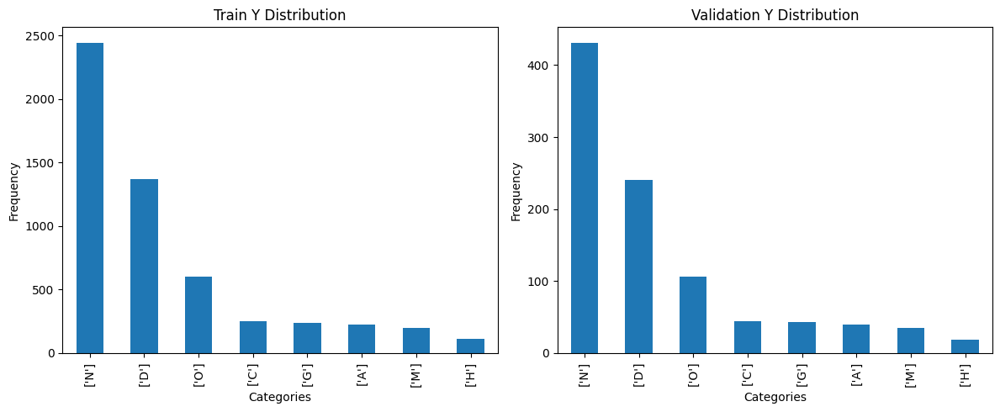

In [ ]:
import pandas as pd
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


# Shuffle the data
SEED = 42  # Set a random seed for reproducibility
x, y = shuffle(x, y, random_state=SEED)

# Check the distribution of classes in the target variable
class_distribution = y.value_counts()
print("Class distribution in the target variable:\n", class_distribution)

# If any class has fewer than 2 instances, handle accordingly
if class_distribution.min() < 2:
    print("Warning: Some classes have fewer than 2 instances. Proceeding without stratification.")
    train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15, random_state=SEED)
else:
    train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                                          stratify=y, random_state=SEED)

# Print the shapes of the resulting datasets
print(f'Train X: {train_x.shape}, Train Y: {train_y.shape}')
print(f'Valid X: {valid_x.shape}, Valid Y: {valid_y.shape}')

# Plot histograms of the target distributions
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
train_y.value_counts().plot(kind='bar', title='Train Y Distribution')
plt.xlabel('Categories')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
valid_y.value_counts().plot(kind='bar', title='Validation Y Distribution')
plt.xlabel('Categories')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()



Visualize a sample of images from each class in the dataset

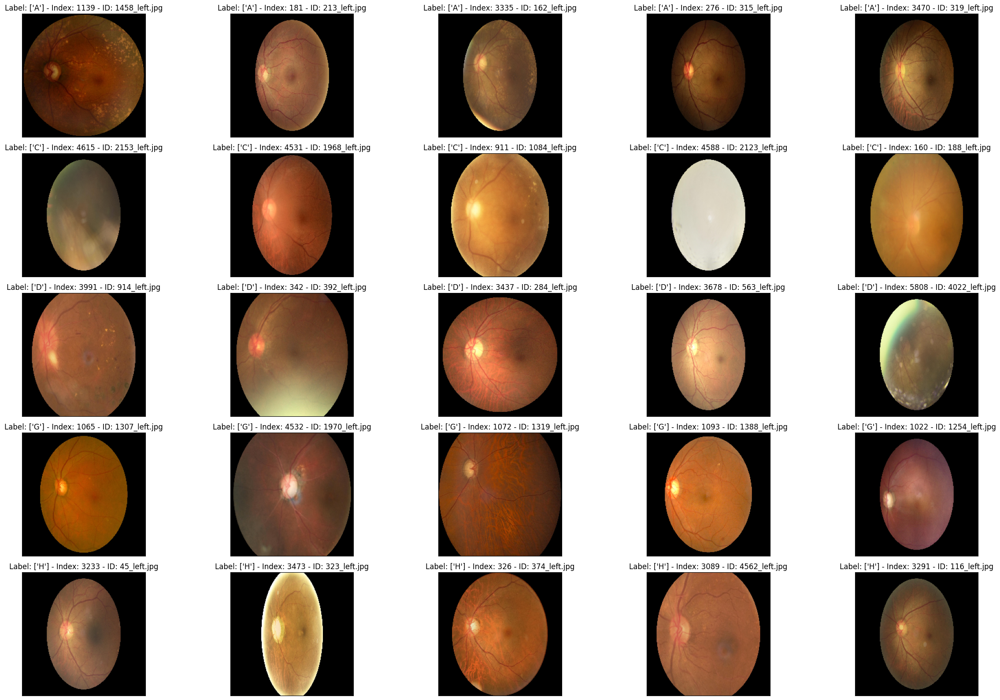

In [ ]:
import matplotlib.pyplot as plt
import cv2
import pandas as pd

# Set image size
IMG_SIZE = 224
SEED = 42

# Create a DataFrame from train_x and train_y
df = pd.DataFrame({'Left-Fundus': train_x, 'labels': train_y})

# Get unique labels and limit the number of classes if needed
unique_labels = sorted(df['labels'].unique())
max_classes = 5  # Adjust as needed; this will show at most 5 classes
fig = plt.figure(figsize=(25, 16))

# Display images for a limited number of classes
for class_id in unique_labels[:max_classes]:
    class_data = df[df['labels'] == class_id]
    for i, (idx, row) in enumerate(class_data.sample(min(5, len(class_data)), random_state=SEED).iterrows()):
        # Calculate the subplot index, ensuring it is within range
        subplot_index = unique_labels.index(class_id) * 5 + i + 1
        if subplot_index > 25:
            break
        ax = fig.add_subplot(5, 5, subplot_index, xticks=[], yticks=[])

        # Construct the image path
        path = f"/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images/{row['Left-Fundus']}"
        image = cv2.imread(path)

        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
            ax.imshow(image)
            ax.set_title(f'Label: {class_id} - Index: {idx} - ID: {row["Left-Fundus"]}')
        else:
            ax.text(0.5, 0.5, 'Image not found', fontsize=12, ha='center', va='center')
            ax.set_title(f'Missing Image - Label: {class_id} - ID: {row["Left-Fundus"]}')

plt.tight_layout()
plt.show()


Error handling for missing images in Labels Handled and Images Converted to grayscale and display the images in grayscale.

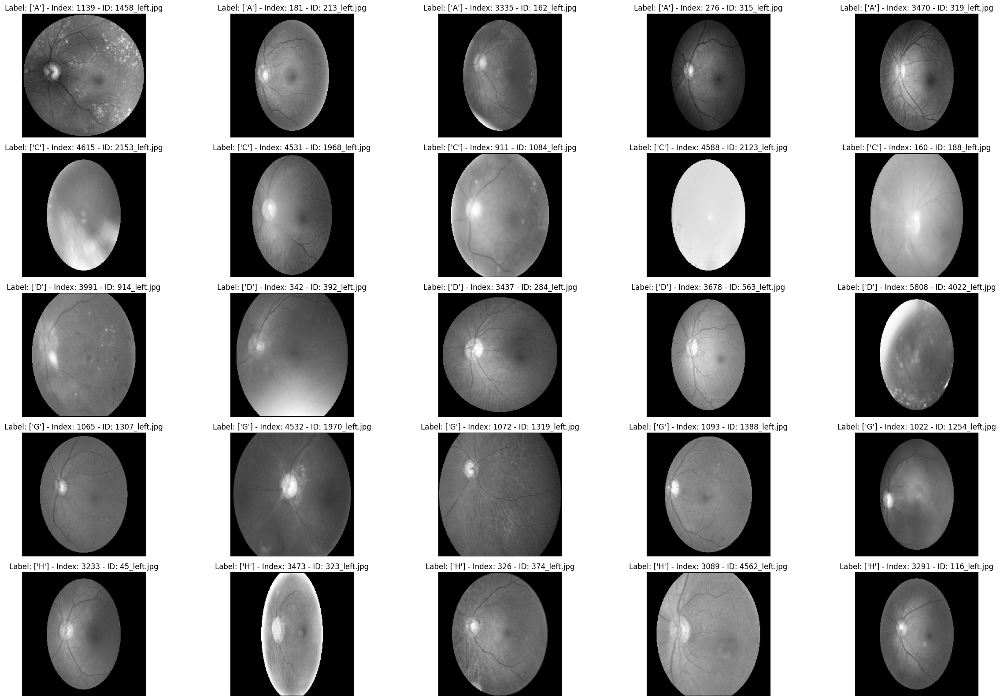

In [ ]:


import matplotlib.pyplot as plt
import cv2
import pandas as pd

# Set image size (you can adjust IMG_SIZE as needed)
IMG_SIZE = 224
SEED = 42

# Create a DataFrame from train_x and train_y
df = pd.DataFrame({'Left-Fundus': train_x, 'labels': train_y})

# Get unique labels and limit the number of classes if needed
unique_labels = sorted(df['labels'].unique())
max_classes = 5  # Adjust as needed; this will show at most 5 classes
fig = plt.figure(figsize=(25, 16))

# Display images for a limited number of classes
for class_id in unique_labels[:max_classes]:
    class_data = df[df['labels'] == class_id]
    for i, (idx, row) in enumerate(class_data.sample(min(5, len(class_data)), random_state=SEED).iterrows()):
        # Calculate the subplot index, ensuring it is within range
        subplot_index = unique_labels.index(class_id) * 5 + i + 1
        if subplot_index > 25:
            break
        ax = fig.add_subplot(5, 5, subplot_index, xticks=[], yticks=[])

        # Construct the image path
        path = f"/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images/{row['Left-Fundus']}"
        image = cv2.imread(path)

        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
            image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
            ax.imshow(image, cmap='gray')
            ax.set_title(f'Label: {class_id} - Index: {idx} - ID: {row["Left-Fundus"]}')

        else:
            ax.text(0.5, 0.5, 'Image not found', fontsize=12, ha='center', va='center')
            ax.set_title(f'Missing Image - Label: {class_id} - ID: {row["Left-Fundus"]}')

plt.tight_layout()
plt.show()


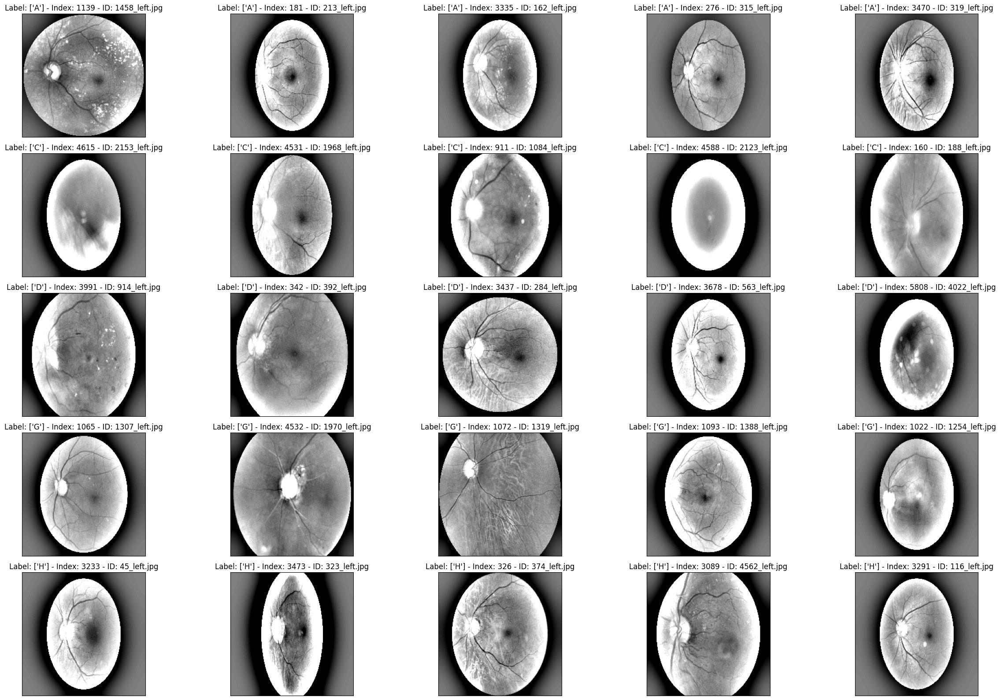

In [ ]:
import matplotlib.pyplot as plt
import cv2
import pandas as pd

# Set image size
IMG_SIZE = 224
SEED = 42

# Assuming df is your DataFrame containing 'Left-Fundus' and 'labels'
df = pd.DataFrame({'Left-Fundus': train_x, 'labels': train_y})

fig = plt.figure(figsize=(25, 16))

# Display 5 images from each class
for class_id in sorted(df['labels'].unique()):
    class_data = df[df['labels'] == class_id]
    for i, (idx, row) in enumerate(class_data.sample(5, random_state=SEED).iterrows()):
        # Calculate the subplot index
        subplot_index = sorted(df['labels'].unique()).index(class_id) * 5 + i + 1
        if subplot_index > 25:
            break
        ax = fig.add_subplot(5, 5, subplot_index, xticks=[], yticks=[])

        # Construct the image path
        path = f"/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images/{row['Left-Fundus']}"
        image = cv2.imread(path)

        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
            image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
            # Apply image enhancement
            image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), IMG_SIZE / 10), -4, 128)

            ax.imshow(image, cmap='gray')
            ax.set_title(f'Label: {class_id} - Index: {idx} - ID: {row["Left-Fundus"]}')
        else:
            ax.text(0.5, 0.5, 'Image not found', fontsize=12, ha='center', va='center')
            ax.set_title(f'Missing Image - Label: {class_id} - ID: {row["Left-Fundus"]}')

plt.tight_layout()
plt.show()


Added Image Enhancement

Ensure Consistency: The crop_image1 function is a bit simplified and is suitable for grayscale images. In the crop_image_from_gray function, additional checks and enhancements are applied to handle RGB images properly.

Handling Edge Cases: Ensure that when cropping an image, you handle cases where the mask might crop out everything or where images are already within valid boundaries.


In [ ]:
import numpy as np
import cv2

def crop_image1(img, tol=7):
    """
    Crop the grayscale image based on the tolerance value.

    Parameters:
    - img: Grayscale image data as a 2D numpy array.
    - tol: Tolerance value to determine the threshold for cropping.

    Returns:
    - Cropped image as a 2D numpy array.
    """
    mask = img > tol
    return img[np.ix_(mask.any(1), mask.any(0))]

def crop_image_from_gray(img, tol=7):
    """
    Crop the image based on the tolerance value. Handles both grayscale and RGB images.

    Parameters:
    - img: Image data as a 2D (grayscale) or 3D (RGB) numpy array.
    - tol: Tolerance value to determine the threshold for cropping.

    Returns:
    - Cropped image as a 2D or 3D numpy array depending on input.
    """
    if img.ndim == 2:  # Grayscale image
        mask = img > tol
        return img[np.ix_(mask.any(1), mask.any(0))]

    elif img.ndim == 3:  # RGB image
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img > tol

        # Ensure that mask does not crop out the entire image
        if mask.any():
            img_cropped = img[np.ix_(mask.any(1), mask.any(0))]
            return img_cropped
        else:
            # Return original image if no content is left after cropping
            return img
    else:
        raise ValueError("Unsupported image dimensions: {}".format(img.ndim))



In [ ]:
import cv2
import numpy as np

def load_color(path, sigmaX=10, img_size=224):
    """
    Load an image, apply cropping, resizing, and enhancement.

    Parameters:
    - path: Path to the image file.
    - sigmaX: Standard deviation for Gaussian kernel used in enhancement.
    - img_size: Desired size to resize the image to.

    Returns:
    - Processed image as a numpy array.
    """
    # Load the image
    image = cv2.imread(path)

    if image is None:
        raise FileNotFoundError(f"Image not found at path: {path}")

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Crop the image
    image = crop_image_from_gray(image)

    # Resize the image
    image = cv2.resize(image, (img_size, img_size))

    # Enhance the image
    image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), sigmaX), -4, 128)

    return image


array([[[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       ...,

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[128, 128, 128],
        [128, 128, 128],
        [128, 128, 128],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]]], dtype=uint8)
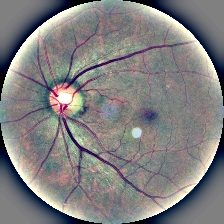

In [ ]:
load_color(path, sigmaX=10, img_size=224)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def preprocess_function(image):
    """
    Wrapper function for custom preprocessing.
    """
    image = tf.image.resize(image, [img_size, img_size])
    image = load_color(image.numpy(), sigmaX=10, img_size=img_size)
    return image

# Define ImageDataGenerator with custom preprocessing
train_datagen = ImageDataGenerator(
    preprocessing_function=lambda x: preprocess_function(tf.convert_to_tensor(x)),
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(
    preprocessing_function=lambda x: preprocess_function(tf.convert_to_tensor(x)),
    rescale=1./255
)


 load an image, apply cropping, resizing, and enhancement.

In [ ]:
def load_and_preprocess_image_and_label(path, img_size, sigmaX=10):
    """
    Load, preprocess, resize an image and get its label.

    Parameters:
    - path: Path to the image file.
    - img_size: Desired size to resize the image to.
    - sigmaX: Standard deviation for Gaussian kernel used in enhancement.

    Returns:
    - Tuple of (processed image as tensor, label as integer tensor).
    """
    # Load the image
    image = cv2.imread(path)

    if image is None:
        raise FileNotFoundError(f"Image not found at path: {path}")

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Crop the image
    image = crop_image_from_gray(image)

    # Resize the image
    image = cv2.resize(image, (img_size, img_size))

    # Enhance the image
    image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), sigmaX), -4, 128)

    # Convert to tensor and normalize
    image = tf.convert_to_tensor(image, dtype=tf.float32) / 255.0

    # Generate a label based on file name or other method
    label = get_label_from_path(path)  # Implement this function based on your dataset

    return image, label




In [ ]:
def create_dataset_with_labels(image_paths, img_size, sigmaX=10, batch_size=32):
    """
    Create a TensorFlow dataset from image paths with labels.

    Parameters:
    - image_paths: List of image file paths.
    - img_size: Desired image size for resizing.
    - sigmaX: Standard deviation for Gaussian kernel used in enhancement.
    - batch_size: Batch size for the dataset.

    Returns:
    - A TensorFlow dataset object with images and labels.
    """
    def generator():
        for path in image_paths:
            yield load_and_preprocess_image_and_label(path, img_size, sigmaX)

    dataset = tf.data.Dataset.from_generator(generator, output_signature=(
        tf.TensorSpec(shape=(img_size, img_size, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.int32)  # Adjust according to your label type
    ))
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return dataset


In [ ]:
dataDir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images'
labelsCsv = '/content/archive-2/archive-2/full_df.csv'

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

class oculardata:
    def __init__(self, dataDir, labelsCsv):
        self.data_dir = dataDir
        self.labels_csv = labelsCsv

    def dataPaths(self):
        filepaths = []
        labels = []

        # Load labels from CSV
        label_df = pd.read_csv(self.labels_csv)
        file_labels = dict(zip(label_df['filename'], label_df['labels']))

        # Iterate over image files
        for file in os.listdir(self.data_dir):
            fpath = os.path.join(self.data_dir, file)
            if os.path.isfile(fpath):
                filepaths.append(fpath)
                # Extract label from the CSV data
                labels.append(file_labels.get(file, 'unknown'))  # Use 'unknown' if the file label is missing

        return filepaths, labels

    def dataFrame(self, files, labels):
        Fseries = pd.Series(files, name='filepaths')
        Lseries = pd.Series(labels, name='labels')
        return pd.concat([Fseries, Lseries], axis=1)

    def split_(self):
        files, labels = self.dataPaths()
        df = self.dataFrame(files, labels)
        strat = df['labels']

        # Split into train and temp (validation + test)
        trainData, dummyData = train_test_split(df, train_size=0.8, shuffle=True, random_state=42, stratify=strat)

        # Split temp into validation and test
        strat = dummyData['labels']
        validData, testData = train_test_split(dummyData, train_size=0.5, shuffle=True, random_state=42, stratify=strat)

        return trainData, validData, testData


View Data Splits for Training, Validation, Testing Data

In [ ]:
dataSplit = oculardata(dataDir, labelsCsv)
train_data, valid_data, test_data = dataSplit.split_()

In [ ]:
print("Training data:")
print(train_data.head())

print("Validation data:")
print(valid_data.head())

print("Test data:")
print(test_data.head())


Training data:
                                              filepaths labels
1920  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
1314  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['O']
3982  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
3369  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['C']
4480  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
Validation data:
                                              filepaths labels
2722  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
2532  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['G']
409   /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
1823  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
1332  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
Test data:
                                              filepaths labels
1267  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
5809  /content/archive-2/archive-2/ODIR-5K/ODIR-5K/T...  ['N']
174   /conte

In [ ]:
print("Training data distribution:")
print(train_data['labels'].value_counts())

print("Validation data distribution:")
print(valid_data['labels'].value_counts())

print("Test data distribution:")
print(test_data['labels'].value_counts())


Training data distribution:
labels
['N']      2299
['D']      1286
['O']       566
unknown     486
['C']       234
['G']       227
['A']       213
['M']       186
['H']       103
Name: count, dtype: int64
Validation data distribution:
labels
['N']      287
['D']      161
['O']       71
unknown     61
['C']       30
['G']       28
['A']       27
['M']       23
['H']       12
Name: count, dtype: int64
Test data distribution:
labels
['N']      287
['D']      161
['O']       71
unknown     61
['C']       29
['G']       29
['A']       26
['M']       23
['H']       13
Name: count, dtype: int64


Display A Random Image with Label

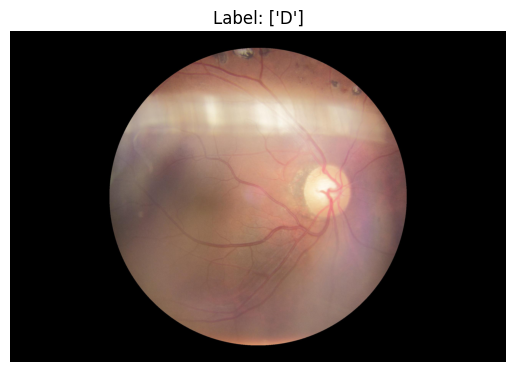

In [ ]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

def display_random_image(df):
    # Sample a random row from the DataFrame
    random_row = df.sample(1).iloc[0]

    # Extract the file path and label from the random row
    filepath = random_row['filepaths']
    label = random_row['labels']

    # Open the image file
    img = Image.open(filepath)

    # Display the image
    plt.imshow(img)
    plt.title(f'Label: {label}')
    plt.axis('off')  # Turn off axis
    plt.show()

# Example usage
display_random_image(train_data)


In [ ]:
import tensorflow as tf

def augment_data(train_df, valid_df, test_df, batch_size=16):
    img_size = (256, 256)  # Target size for images
    color = 'rgb'  # Color mode (RGB images)

    # Data augmentation for training
    train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
        rotation_range=30,
        horizontal_flip=True,
        vertical_flip=True,
        brightness_range=[0.5, 1.5]
    )

    # No augmentation for validation and test sets
    valid_test_datagen = tf.keras.preprocessing.image.ImageDataGenerator()

    # Create training data generator
    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_df,
        x_col='filepaths',
        y_col='labels',
        target_size=img_size,
        color_mode=color,
        batch_size=batch_size,
        shuffle=True,
        class_mode='categorical'
    )

    print("Shape of augmented training images:", train_generator.image_shape)

    # Create validation data generator
    valid_generator = valid_test_datagen.flow_from_dataframe(
        dataframe=valid_df,
        x_col='filepaths',
        y_col='labels',
        target_size=img_size,
        color_mode=color,
        batch_size=batch_size,
        shuffle=False,
        class_mode='categorical'
    )

    print("Shape of validation images:", valid_generator.image_shape)

    # Create test data generator
    test_generator = valid_test_datagen.flow_from_dataframe(
        dataframe=test_df,
        x_col='filepaths',
        y_col='labels',
        target_size=img_size,
        color_mode=color,
        batch_size=batch_size,
        shuffle=False,
        class_mode='categorical'
    )

    print("Shape of test images:", test_generator.image_shape)

    return train_generator, valid_generator, test_generator


Found 5600 validated image filenames belonging to 9 classes.
Shape of augmented training images: (256, 256, 3)
Found 700 validated image filenames belonging to 9 classes.
Shape of validation images: (256, 256, 3)
Found 700 validated image filenames belonging to 9 classes.
Shape of test images: (256, 256, 3)


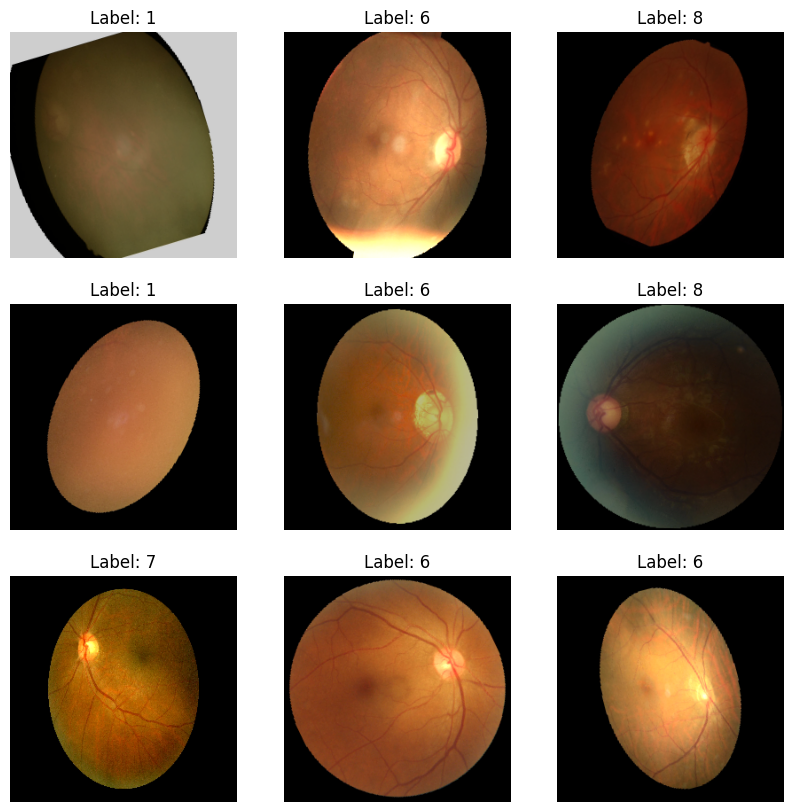

In [ ]:
train_augmented, valid_augmented, test_augmented = augment_data(train_data, valid_data, test_data)

# Example of displaying a batch of augmented images from the training generator
def display_batch(generator, batch_index=0):
    batch = next(generator)
    images, labels = batch
    plt.figure(figsize=(10, 10))
    for i in range(min(9, len(images))):  # Display up to 9 images
        plt.subplot(3, 3, i + 1)
        img = images[i]
        plt.imshow(img.astype('uint8'))
        plt.title(f'Label: {labels[i].argmax()}')
        plt.axis('off')
    plt.show()

# Display a batch of augmented images
display_batch(train_augmented)

In [ ]:
import os
# Define the correct base directory for the images
correct_base_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images'

# Update the filepath column in the dataframe to reflect the correct paths
df['filepath'] = df['filepath'].apply(lambda x: os.path.join(correct_base_dir, os.path.basename(x)))


In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Function to load an image from a file path
def load_image(filepath, target_size=(224, 224)):
    img = load_img(filepath, target_size=target_size)
    img = img_to_array(img)
    img = img / 255.0  # Normalize to [0,1]
    return img

#  Load the first image from the dataframe
first_image_path = df['filepath'].iloc[0]
first_image = load_image(first_image_path)

# Display the shape of the loaded image
print(first_image.shape)

# Load all images into arrays
image_data = []
for filepath in df['filepath']:
    image_data.append(load_image(filepath))

# Convert list to numpy array
image_data = np.array(image_data)

# Display the shape of the image data array
print(image_data.shape)


(224, 224, 3)
(6392, 224, 224, 3)


In [ ]:
from sklearn.model_selection import train_test_split

# Extract the labels (targets) from the dataframe
labels = np.array(df['target'].tolist())

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Display the shapes of the split datasets
print("Training data shape:", X_train.shape)
print("Validation data shape:", X_val.shape)
print("Training labels shape:", y_train.shape)
print("Validation labels shape:", y_val.shape)


Training data shape: (5113, 224, 224, 3)
Validation data shape: (1279, 224, 224, 3)
Training labels shape: (5113,)
Validation labels shape: (1279,)


In [ ]:
print(X_train.shape, X_train.dtype)
print(X_val.shape, X_val.dtype)
print(y_train.shape, y_train.dtype)
print(y_val.shape, y_val.dtype)


(5113, 224, 224, 3) float32
(1279, 224, 224, 3) float32
(5113,) <U24
(1279,) <U24


In [ ]:
import numpy as np
import ast

# Function to convert string representation of list to actual list
def convert_labels(labels):
    return np.array([ast.literal_eval(label) for label in labels])

# Convert training and validation labels from string representation to numpy arrays
y_train = convert_labels(y_train)
y_val = convert_labels(y_val)


In [ ]:
print(X_train.shape, X_train.dtype)
print(X_val.shape, X_val.dtype)
print(y_train.shape, y_train.dtype)
print(y_val.shape, y_val.dtype)


(5113, 224, 224, 3) float32
(1279, 224, 224, 3) float32
(5113, 8) int64
(1279, 8) int64


In [ ]:
from tensorflow.keras import mixed_precision

policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)


In [ ]:
import tensorflow as tf
from keras import backend as K

K.clear_session()
tf.keras.backend.clear_session()


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam

# Load VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

# Build the VGG16 model
model_vgg16 = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='sigmoid')  # 8 output neurons for multi-label classification
])

# Compile the model
model_vgg16.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Train the VGG16 model
history_vgg16 = model_vgg16.fit(
    X_train, y_train,
    batch_size=32,
    epochs=200,
    validation_data=(X_val, y_val)
)


Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 60s 298ms/step - accuracy: 0.3763 - loss: 0.3486 - val_accuracy: 0.4527 - val_loss: 0.2789
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - accuracy: 0.4271 - loss: 0.3093 - val_accuracy: 0.4746 - val_loss: 0.2707
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - accuracy: 0.4504 - loss: 0.2946 - val_accuracy: 0.4777 - val_loss: 0.2650
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - accuracy: 0.4641 - loss: 0.2854 - val_accuracy: 0.4801 - val_loss: 0.2622
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - accuracy: 0.4850 - loss: 0.2769 - val_accuracy: 0.4988 - val_loss: 0.2595
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - accuracy: 0.4899 - loss: 0.2728 - val_accuracy: 0.5051 - val_loss: 0.2563
Epoch 7/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - accuracy: 0.4839 - loss: 0.2783 - val_accuracy: 0.5043 - val_loss: 0.2551
Epoch 8/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - accuracy: 0.4983 -

In [ ]:
from sklearn.metrics import classification_report

# Evaluate the model
val_loss, val_acc = model_vgg16.evaluate(X_val, y_val)
print("Validation loss for VGG16:", val_loss)
print("Validation accuracy for VGG16:", val_acc)

# Make predictions on the validation set
y_pred = model_vgg16.predict(X_val)
y_pred_binary = (y_pred > 0.5).astype(int)

# Generate a classification report
report = classification_report(y_val, y_pred_binary, target_names=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'])
print("Classification report for VGG16:")
print(report)


40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - accuracy: 0.5492 - loss: 0.3171
Validation loss for VGG16: 0.31801125407218933
Validation accuracy for VGG16: 0.5332291126251221
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step
Classification report for VGG16:
              precision    recall  f1-score   support

           N       0.60      0.64      0.62       569
           D       0.55      0.25      0.34       333
           G       0.52      0.18      0.27        61
           C       0.76      0.60      0.67        58
           A       0.33      0.02      0.04        46
           H       1.00      0.07      0.13        28
           M       0.89      0.67      0.76        48
           O       0.25      0.02      0.04       136

   micro avg       0.60      0.42      0.49      1279
   macro avg       0.61      0.31      0.36      1279
weighted avg       0.56      0.42      0.45      1279
 samples avg       0.41      0.42      0.41      1279



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch	Train Accuracy	Val Accuracy	Train Loss	Val Loss
1	0.4107		0.4527		0.3267		0.2789
2	0.4277		0.4746		0.3034		0.2707
3	0.4549		0.4777		0.2910		0.2650
4	0.4565		0.4801		0.2876		0.2622
5	0.4768		0.4988		0.2797		0.2595
6	0.4796		0.5051		0.2765		0.2563
7	0.4864		0.5043		0.2735		0.2551
8	0.4981		0.5238		0.2696		0.2549
9	0.4974		0.5145		0.2653		0.2515
10	0.5067		0.5184		0.2619		0.2525
11	0.5103		0.5278		0.2615		0.2526
12	0.5234		0.5082		0.2594		0.2517
13	0.5183		0.5262		0.2584		0.2486
14	0.5267		0.5348		0.2555		0.2499
15	0.5179		0.5332		0.2535		0.2469
16	0.5269		0.5106		0.2515		0.2502
17	0.5316		0.5371		0.2504		0.2457
18	0.5376		0.5074		0.2469		0.2521
19	0.5243		0.5309		0.2501		0.2463
20	0.5312		0.5090		0.2462		0.2489
21	0.5353		0.5184		0.2450		0.2466
22	0.5437		0.5223		0.2438		0.2449
23	0.5406		0.5043		0.2440		0.2590
24	0.5453		0.5403		0.2422		0.2451
25	0.5523		0.5309		0.2394		0.2443
26	0.5478		0.5364		0.2399		0.2446
27	0.5553		0.5418		0.2380		0.2447
28	0.5639		0.5309		0.2358		0.2439
29	

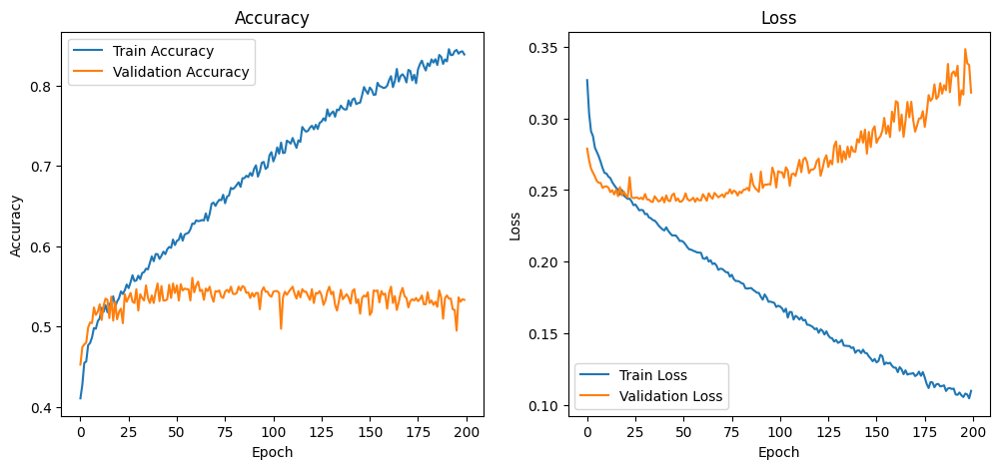

40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step


<Figure size 800x800 with 0 Axes>

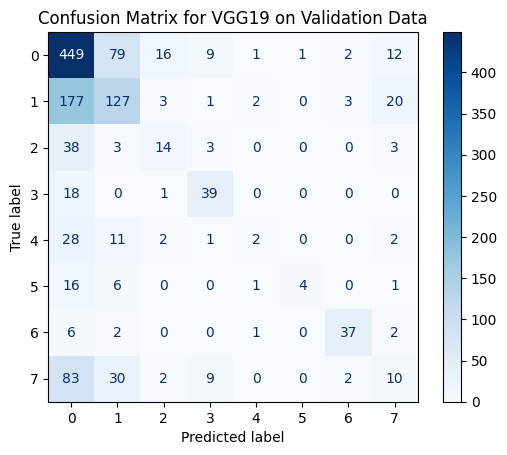

Confusion Matrix:
[[449  79  16   9   1   1   2  12]
 [177 127   3   1   2   0   3  20]
 [ 38   3  14   3   0   0   0   3]
 [ 18   0   1  39   0   0   0   0]
 [ 28  11   2   1   2   0   0   2]
 [ 16   6   0   0   1   4   0   1]
 [  6   2   0   0   1   0  37   2]
 [ 83  30   2   9   0   0   2  10]]


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get the training and validation accuracy from the history object
train_acc = history_vgg16.history['accuracy']
val_acc = history_vgg16.history['val_accuracy']

# Get the training and validation loss
train_loss = history_vgg16.history['loss']
val_loss = history_vgg16.history['val_loss']

# Print the training and validation accuracy and loss
print("Epoch\tTrain Accuracy\tVal Accuracy\tTrain Loss\tVal Loss")
for epoch in range(len(train_acc)):
    print(f"{epoch + 1}\t{train_acc[epoch]:.4f}\t\t{val_acc[epoch]:.4f}\t\t{train_loss[epoch]:.4f}\t\t{val_loss[epoch]:.4f}")

# Optional: Plot the accuracy and loss
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(train_acc, label='Train Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')

plt.show()

# Predict the validation data
val_predictions = model_vgg16.predict(X_val)
predicted_labels = np.argmax(val_predictions, axis=1)
true_labels = np.argmax(y_val, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot(cmap=plt.cm.Blues, values_format='g')
plt.title('Confusion Matrix for VGG19 on Validation Data')
plt.show()

print("Confusion Matrix:")
print(conf_matrix)


In [ ]:
# Save the trained model
model_vgg16.save('vgg16_model.keras')


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 64s 308ms/step - accuracy: 0.3489 - loss: 0.4450 - val_accuracy: 0.4449 - val_loss: 0.2981
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - accuracy: 0.4324 - loss: 0.3104 - val_accuracy: 0.4449 - val_loss: 0.2939
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - accuracy: 0.4492 - loss: 0.3026 - val_accuracy: 0.4449 - val_loss: 0.2917
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - accuracy: 0.4435 - loss: 0.3016 - val_accuracy: 0.4488 - val_loss: 0.2888
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - accuracy: 0.4543 - loss: 0.2944 - val_accuracy: 0.4504 - val_loss: 0.2861
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - accuracy: 0.4607 - loss: 0.2936 - val_accuracy: 0.4550 - val_loss: 0.2840
Epoc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


59	0.5126		0.5113		0.2554		0.2522
60	0.5144		0.5043		0.2547		0.2524
61	0.5150		0.5160		0.2539		0.2517
62	0.5111		0.5043		0.2543		0.2523
63	0.5099		0.5231		0.2544		0.2518
64	0.5154		0.5020		0.2535		0.2523
65	0.5175		0.5152		0.2531		0.2516
66	0.5222		0.5199		0.2530		0.2515
67	0.5163		0.5176		0.2529		0.2510
68	0.5181		0.5184		0.2528		0.2508
69	0.5204		0.5168		0.2519		0.2504
70	0.5163		0.5121		0.2525		0.2506
71	0.5222		0.5137		0.2521		0.2504
72	0.5242		0.5145		0.2510		0.2501
73	0.5228		0.5160		0.2517		0.2506
74	0.5236		0.5278		0.2517		0.2505
75	0.5208		0.5098		0.2508		0.2501
76	0.5199		0.5113		0.2510		0.2498
77	0.5242		0.5121		0.2509		0.2497
78	0.5159		0.5090		0.2509		0.2503
79	0.5259		0.5168		0.2501		0.2495
80	0.5238		0.5270		0.2499		0.2491
81	0.5220		0.5129		0.2496		0.2499
82	0.5343		0.5059		0.2499		0.2508
83	0.5224		0.5309		0.2491		0.2486
84	0.5255		0.5098		0.2494		0.2494
85	0.5261		0.5059		0.2491		0.2498
86	0.5199		0.5278		0.2500		0.2480
87	0.5273		0.5168		0.2488		0.2482
88	0.5218		0.5

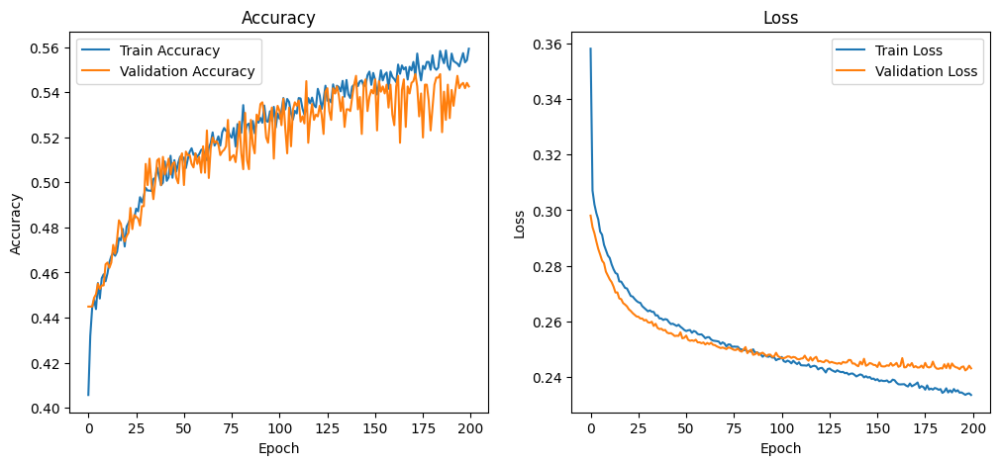

40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step


<Figure size 800x800 with 0 Axes>

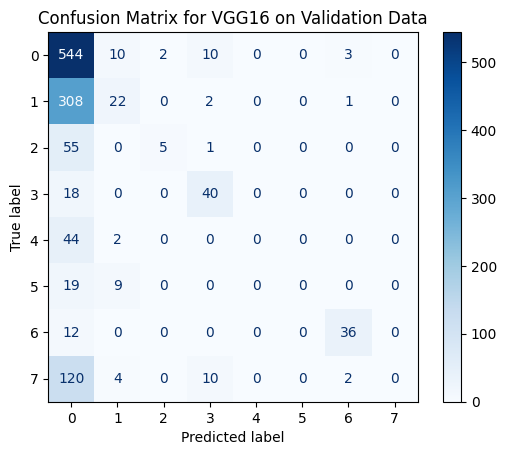

Confusion Matrix:
[[544  10   2  10   0   0   3   0]
 [308  22   0   2   0   0   1   0]
 [ 55   0   5   1   0   0   0   0]
 [ 18   0   0  40   0   0   0   0]
 [ 44   2   0   0   0   0   0   0]
 [ 19   9   0   0   0   0   0   0]
 [ 12   0   0   0   0   0  36   0]
 [120   4   0  10   0   0   2   0]]
Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 35s 207ms/step - accuracy: 0.3510 - loss: 0.4152 - val_accuracy: 0.4449 - val_loss: 0.2983
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 29s 182ms/step - accuracy: 0.4337 - loss: 0.3078 - val_accuracy: 0.4449 - val_loss: 0.2959
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 29s 180ms/step - accuracy: 0.4525 - loss: 0.3033 - val_accuracy: 0.4449 - val_loss: 0.2933
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - accuracy: 0.4349 - loss: 0.3025 - val_accuracy: 0.4449 - val_loss: 0.2907
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 29s 181ms/step - accuracy: 0.4410 - loss: 0.3007 - val_accuracy: 0.4441 - val_loss: 0.2893
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


36	0.4940		0.4926		0.2669		0.2626
37	0.4901		0.5098		0.2665		0.2629
38	0.4936		0.4965		0.2656		0.2618
39	0.4950		0.4973		0.2661		0.2621
40	0.4925		0.4934		0.2659		0.2619
41	0.4958		0.4996		0.2656		0.2614
42	0.4933		0.4894		0.2652		0.2613
43	0.4946		0.4965		0.2639		0.2612
44	0.4938		0.4926		0.2649		0.2612
45	0.4921		0.4973		0.2643		0.2604
46	0.4985		0.4965		0.2637		0.2602
47	0.4921		0.5027		0.2640		0.2599
48	0.4979		0.4941		0.2635		0.2617
49	0.4927		0.4973		0.2632		0.2598
50	0.4966		0.4980		0.2629		0.2595
51	0.4985		0.4965		0.2630		0.2603
52	0.4964		0.4988		0.2622		0.2595
53	0.4972		0.4980		0.2624		0.2595
54	0.4987		0.4973		0.2614		0.2588
55	0.4978		0.4949		0.2611		0.2587
56	0.5009		0.5012		0.2609		0.2585
57	0.4995		0.4965		0.2612		0.2585
58	0.4974		0.5090		0.2616		0.2583
59	0.4974		0.4949		0.2613		0.2587
60	0.5005		0.4996		0.2606		0.2589
61	0.4962		0.5043		0.2601		0.2581
62	0.4974		0.5027		0.2597		0.2580
63	0.5011		0.5027		0.2603		0.2579
64	0.5017		0.5137		0.2602		0.2576
65	0.4997		0.4

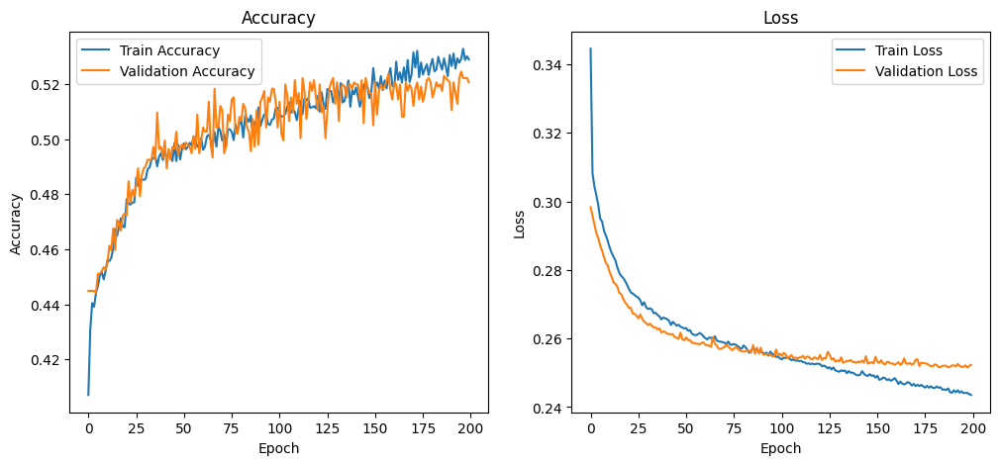

40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step


<Figure size 800x800 with 0 Axes>

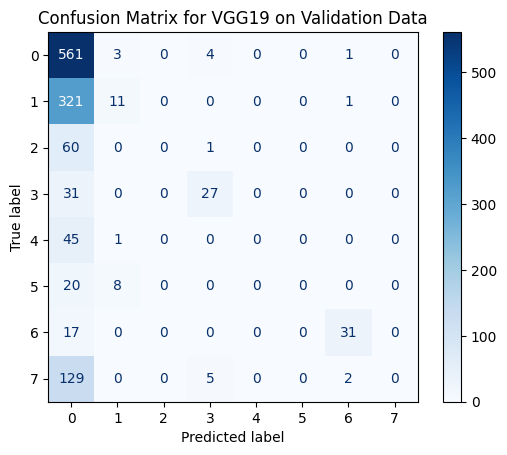

Confusion Matrix:
[[561   3   0   4   0   0   1   0]
 [321  11   0   0   0   0   1   0]
 [ 60   0   0   1   0   0   0   0]
 [ 31   0   0  27   0   0   0   0]
 [ 45   1   0   0   0   0   0   0]
 [ 20   8   0   0   0   0   0   0]
 [ 17   0   0   0   0   0  31   0]
 [129   0   0   5   0   0   2   0]]
Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 40s 182ms/step - accuracy: 0.3786 - loss: 0.3611 - val_accuracy: 0.4449 - val_loss: 0.3004
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 104ms/step - accuracy: 0.4248 - loss: 0.3127 - val_accuracy: 0.4449 - val_loss: 0.2988
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.4454 - loss: 0.3049 - val_accuracy: 0.4457 - val_loss: 0.2974
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.4417 - loss: 0.3015 - val_accuracy: 0.4464 - val_loss: 0.2973
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.4410 - loss: 0.3048 - val_accuracy: 0.4488 - val_loss: 0.2965
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


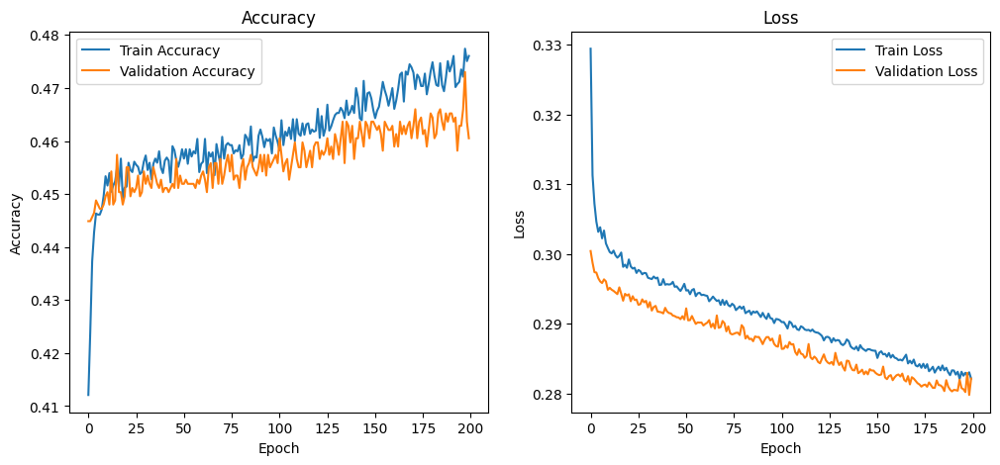

40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step


<Figure size 800x800 with 0 Axes>

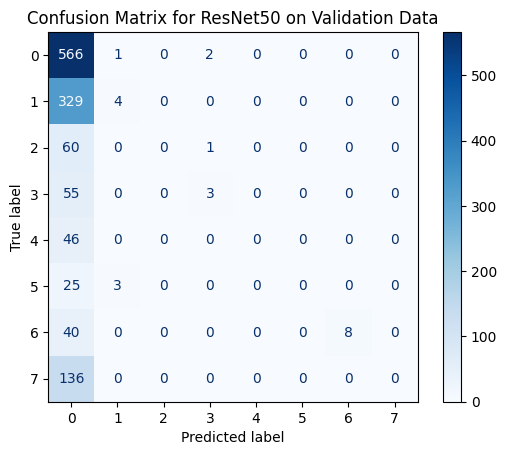

Confusion Matrix:
[[566   1   0   2   0   0   0   0]
 [329   4   0   0   0   0   0   0]
 [ 60   0   0   1   0   0   0   0]
 [ 55   0   0   3   0   0   0   0]
 [ 46   0   0   0   0   0   0   0]
 [ 25   3   0   0   0   0   0   0]
 [ 40   0   0   0   0   0   8   0]
 [136   0   0   0   0   0   0   0]]
Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 69s 284ms/step - accuracy: 0.3860 - loss: 0.3621 - val_accuracy: 0.5262 - val_loss: 0.2592
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - accuracy: 0.4945 - loss: 0.2757 - val_accuracy: 0.5481 - val_loss: 0.2527
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - accuracy: 0.5067 - loss: 0.2647 - val_accuracy: 0.5606 - val_loss: 0.2476
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - accuracy: 0.5135 - loss: 0.2573 - val_accuracy: 0.5434 - val_loss: 0.2448
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - accuracy: 0.5240 - loss: 0.2548 - val_accuracy: 0.5418 - val_loss: 0.2439
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


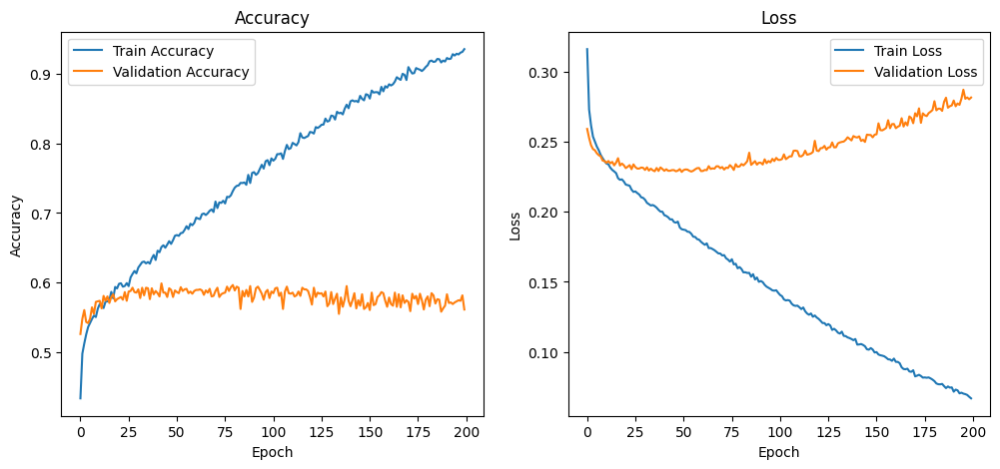

40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step


<Figure size 800x800 with 0 Axes>

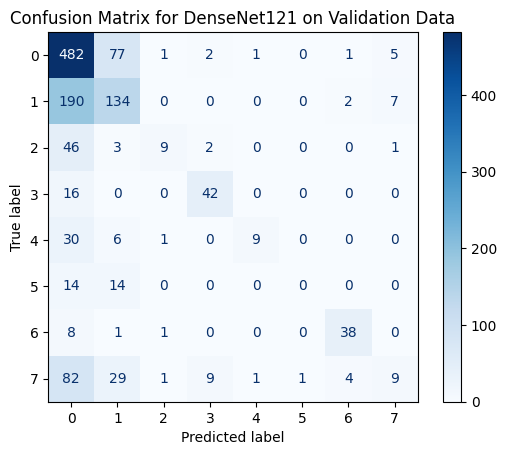

Confusion Matrix:
[[482  77   1   2   1   0   1   5]
 [190 134   0   0   0   0   2   7]
 [ 46   3   9   2   0   0   0   1]
 [ 16   0   0  42   0   0   0   0]
 [ 30   6   1   0   9   0   0   0]
 [ 14  14   0   0   0   0   0   0]
 [  8   1   1   0   0   0  38   0]
 [ 82  29   1   9   1   1   4   9]]


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, DenseNet121
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import pandas as pd

# Function to create and compile a model
def create_and_compile_model(base_model_class, weights_path, num_classes=8):
    base_model = base_model_class(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Create models
model_vgg16 = create_and_compile_model(VGG16, '/content/VGG16_model_new.keras')
model_vgg19 = create_and_compile_model(VGG19, '/content/VGG19_model_new.keras')
model_resnet50 = create_and_compile_model(ResNet50, '/content/ResNet50_model_new.keras')
model_densenet121 = create_and_compile_model(DenseNet121, '/content/DenseNet121_model_new.keras')

# Function to train and evaluate a model
def train_and_evaluate_model(model, X_train, y_train, X_val, y_val, model_name):
    history = model.fit(
        X_train, y_train,
        batch_size=32,
        epochs=200,
        validation_data=(X_val, y_val)
    )

    # Evaluate the model
    val_loss, val_acc = model.evaluate(X_val, y_val)
    print(f"Validation loss for {model_name}: {val_loss}")
    print(f"Validation accuracy for {model_name}: {val_acc}")

    # Make predictions on the validation set
    y_pred = model.predict(X_val)
    y_pred_binary = (y_pred > 0.5).astype(int)

    # Generate a classification report
    report = classification_report(y_val, y_pred_binary, target_names=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'])
    print(f"Classification report for {model_name}:")
    print(report)

    # Get the training and validation accuracy from the history object
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    # Get the training and validation loss
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Print the training and validation accuracy and loss
    print("Epoch\tTrain Accuracy\tVal Accuracy\tTrain Loss\tVal Loss")
    for epoch in range(len(train_acc)):
        print(f"{epoch + 1}\t{train_acc[epoch]:.4f}\t\t{val_acc[epoch]:.4f}\t\t{train_loss[epoch]:.4f}\t\t{val_loss[epoch]:.4f}")

    # Plot the accuracy and loss
    plt.figure(figsize=(12, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(train_acc, label='Train Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy')

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(train_loss, label='Train Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss')

    plt.show()

    # Predict the validation data
    val_predictions = model.predict(X_val)
    predicted_labels = (val_predictions > 0.5).astype(int)
    true_labels = y_val

    # Generate the confusion matrix
    conf_matrix = confusion_matrix(np.argmax(true_labels, axis=1), np.argmax(predicted_labels, axis=1))
    plt.figure(figsize=(8, 8))
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
    disp.plot(cmap=plt.cm.Blues, values_format='g')
    plt.title(f'Confusion Matrix for {model_name} on Validation Data')
    plt.show()

    print("Confusion Matrix:")
    print(conf_matrix)

    # Save the trained model
    model.save(f'{model_name.lower()}_model.keras')

# Train and evaluate models
train_and_evaluate_model(model_vgg16, X_train, y_train, X_val, y_val, 'VGG16')
train_and_evaluate_model(model_vgg19, X_train, y_train, X_val, y_val, 'VGG19')
train_and_evaluate_model(model_resnet50, X_train, y_train, X_val, y_val, 'ResNet50')
train_and_evaluate_model(model_densenet121, X_train, y_train, X_val, y_val, 'DenseNet121')


In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
import os

# Load the saved models
model_vgg16 = load_model('vgg16_model.keras')
model_vgg19 = load_model('vgg19_model.keras')
model_resnet50 = load_model('resnet50_model.keras')
model_densenet121 = load_model('densenet121_model.keras')

# Function to load and preprocess the test images
def load_and_preprocess_image(path):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])
    image = image / 255.0  # Normalize to [0,1]
    return image

# Load test images paths
test_images_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Testing Images'
test_image_paths = [os.path.join(test_images_dir, fname) for fname in os.listdir(test_images_dir)]

# Create a dataset from the image paths
test_dataset = tf.data.Dataset.from_tensor_slices(test_image_paths)
test_dataset = test_dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(32)  # Adjust the batch size as needed

# Function to make predictions
def make_predictions(model, dataset):
    predictions = model.predict(dataset)
    return predictions

# Make predictions with each model
predictions_vgg16 = make_predictions(model_vgg16, test_dataset)
predictions_vgg19 = make_predictions(model_vgg19, test_dataset)
predictions_resnet50 = make_predictions(model_resnet50, test_dataset)
predictions_densenet121 = make_predictions(model_densenet121, test_dataset)

# Post-process the predictions (convert probabilities to binary labels)
def post_process_predictions(predictions, threshold=0.5):
    return (predictions > threshold).astype(int)

predictions_vgg16_binary = post_process_predictions(predictions_vgg16)
predictions_vgg19_binary = post_process_predictions(predictions_vgg19)
predictions_resnet50_binary = post_process_predictions(predictions_resnet50)
predictions_densenet121_binary = post_process_predictions(predictions_densenet121)

# Function to save the predictions to CSV
def save_predictions(predictions, model_name):
    # Create a DataFrame for predictions
    df = pd.DataFrame(predictions, columns=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'])

    # Add image filenames as an index or as a column
    df['Image'] = [os.path.basename(path) for path in test_image_paths]

    # Save to CSV
    df.to_csv(f'{model_name}_test_predictions.csv', index=False)

# Save predictions for each model
save_predictions(predictions_vgg16_binary, 'VGG16')
save_predictions(predictions_vgg19_binary, 'VGG19')
save_predictions(predictions_resnet50_binary, 'ResNet50')
save_predictions(predictions_densenet121_binary, 'DenseNet121')

# Optionally, display the shapes of the predictions
print(f"Shape of VGG16 predictions: {predictions_vgg16_binary.shape}")
print(f"Shape of VGG19 predictions: {predictions_vgg19_binary.shape}")
print(f"Shape of ResNet50 predictions: {predictions_resnet50_binary.shape}")
print(f"Shape of DenseNet121 predictions: {predictions_densenet121_binary.shape}")


32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 314ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 212ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 423ms/step
Shape of VGG16 predictions: (1000, 8)
Shape of VGG19 predictions: (1000, 8)
Shape of ResNet50 predictions: (1000, 8)
Shape of DenseNet121 predictions: (1000, 8)


distribution of predictions on test dataset

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step


<ipython-input-14-ffd5d60ef3f9>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=class_counts, palette='viridis')


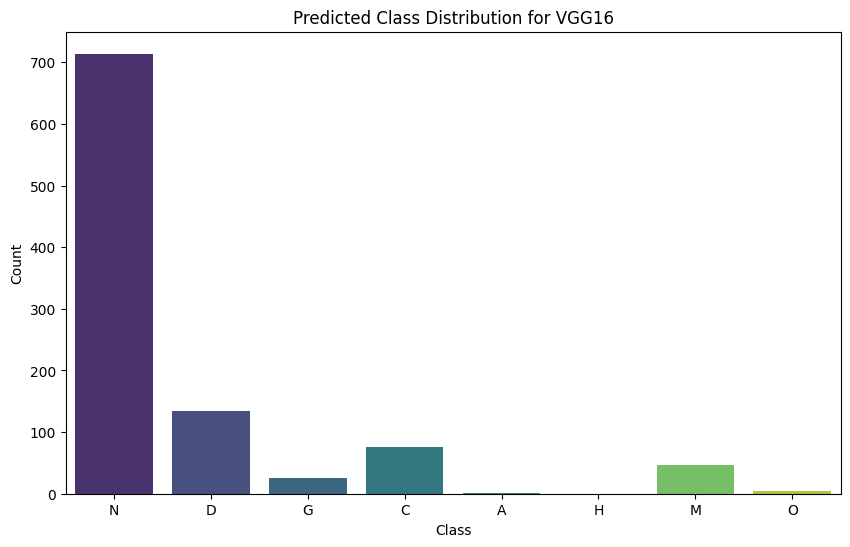

32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step


<ipython-input-14-ffd5d60ef3f9>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=class_counts, palette='viridis')


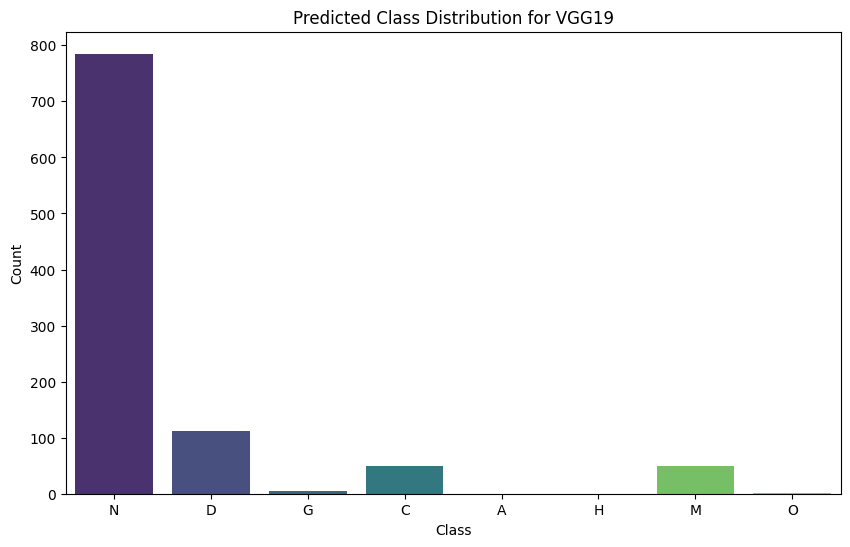

32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 170ms/step


<ipython-input-14-ffd5d60ef3f9>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=class_counts, palette='viridis')


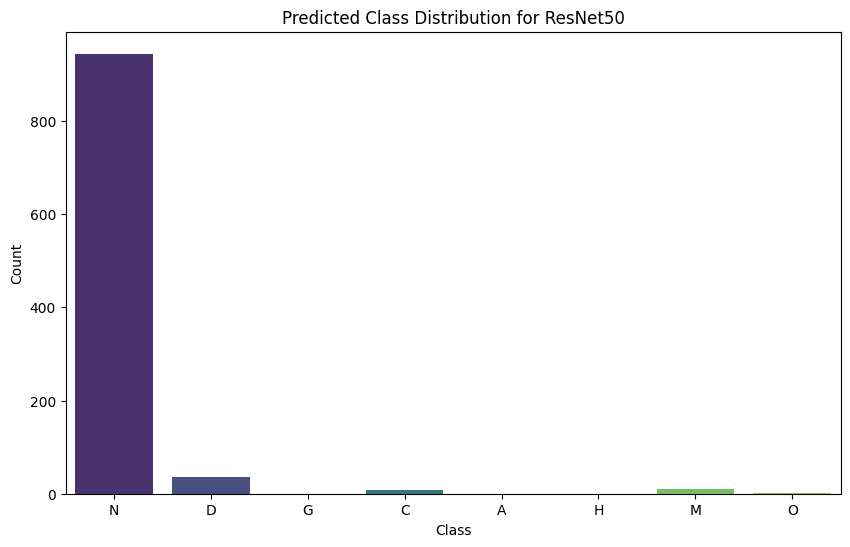

32/32 ━━━━━━━━━━━━━━━━━━━━ 15s 290ms/step


<ipython-input-14-ffd5d60ef3f9>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=class_counts, palette='viridis')


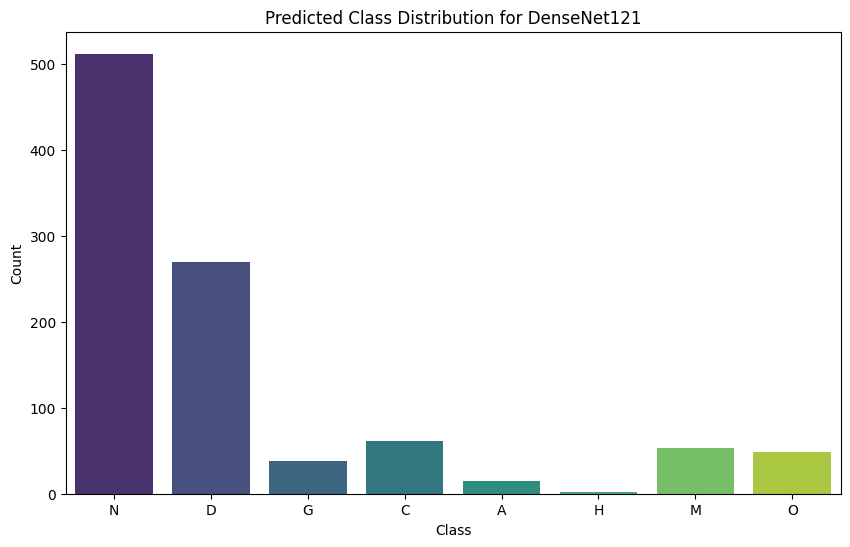

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import load_model

# Define class names
class_names = ['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O']

# Load the saved models
model_vgg16 = load_model('vgg16_model.keras')
model_vgg19 = load_model('vgg19_model.keras')
model_resnet50 = load_model('resnet50_model.keras')
model_densenet121 = load_model('densenet121_model.keras')

# Function to analyze and visualize predictions
def analyze_predictions(model, model_name):
    # Make predictions
    predictions = model.predict(test_dataset)
    predicted_labels = np.argmax(predictions, axis=1)

    # Count the number of predictions for each class
    class_counts = np.bincount(predicted_labels, minlength=len(class_names))

    # Plot the distribution of predictions
    plt.figure(figsize=(10, 6))
    sns.barplot(x=class_names, y=class_counts, palette='viridis')
    plt.title(f'Predicted Class Distribution for {model_name}')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.show()

# Analyze predictions for each model
analyze_predictions(model_vgg16, 'VGG16')
analyze_predictions(model_vgg19, 'VGG19')
analyze_predictions(model_resnet50, 'ResNet50')
analyze_predictions(model_densenet121, 'DenseNet121')


Evaluate on Test Data with Confusion Matrix

40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step
Classification Report for VGG16:
               precision    recall  f1-score   support

           N       0.54      0.85      0.67       569
           D       0.50      0.35      0.41       333
           G       0.43      0.15      0.22        61
           C       0.56      0.74      0.64        58
           A       0.00      0.00      0.00        46
           H       0.00      0.00      0.00        28
           M       0.80      0.81      0.80        48
           O       0.20      0.01      0.01       136

    accuracy                           0.54      1279
   macro avg       0.38      0.36      0.34      1279
weighted avg       0.47      0.54      0.47      1279



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Figure size 800x800 with 0 Axes>

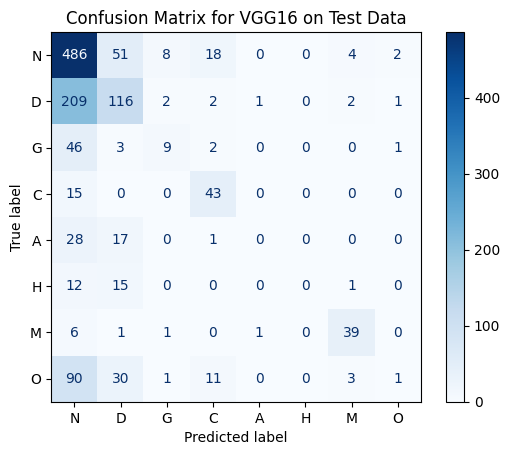

40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step
Classification Report for VGG19:
               precision    recall  f1-score   support

           N       0.51      0.90      0.65       569
           D       0.48      0.25      0.33       333
           G       0.25      0.02      0.03        61
           C       0.66      0.57      0.61        58
           A       0.00      0.00      0.00        46
           H       0.00      0.00      0.00        28
           M       0.79      0.79      0.79        48
           O       0.00      0.00      0.00       136

    accuracy                           0.52      1279
   macro avg       0.34      0.32      0.30      1279
weighted avg       0.42      0.52      0.43      1279



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Figure size 800x800 with 0 Axes>

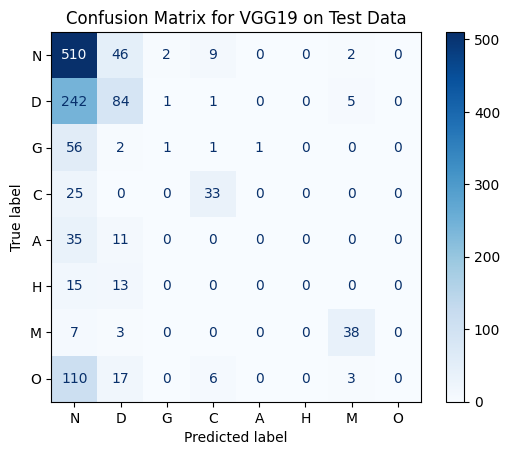

40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step
Classification Report for ResNet50:
               precision    recall  f1-score   support

           N       0.46      0.96      0.62       569
           D       0.40      0.08      0.13       333
           G       0.00      0.00      0.00        61
           C       0.45      0.09      0.14        58
           A       0.00      0.00      0.00        46
           H       0.00      0.00      0.00        28
           M       0.77      0.21      0.33        48
           O       0.00      0.00      0.00       136

    accuracy                           0.46      1279
   macro avg       0.26      0.17      0.15      1279
weighted avg       0.36      0.46      0.33      1279



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Figure size 800x800 with 0 Axes>

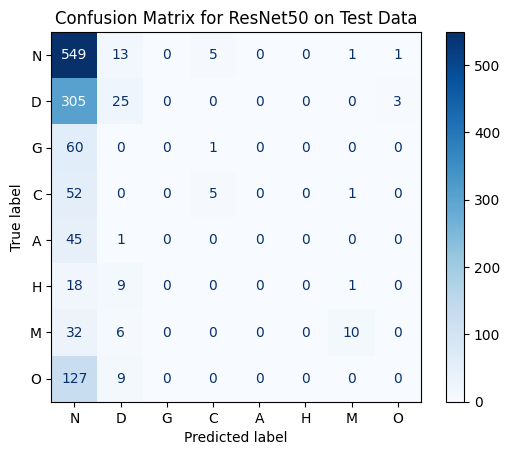

40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step
Classification Report for DenseNet121:
               precision    recall  f1-score   support

           N       0.61      0.72      0.66       569
           D       0.46      0.51      0.49       333
           G       0.58      0.30      0.39        61
           C       0.73      0.78      0.75        58
           A       0.63      0.26      0.37        46
           H       0.25      0.04      0.06        28
           M       0.83      0.90      0.86        48
           O       0.26      0.14      0.18       136

    accuracy                           0.56      1279
   macro avg       0.54      0.45      0.47      1279
weighted avg       0.54      0.56      0.54      1279



<Figure size 800x800 with 0 Axes>

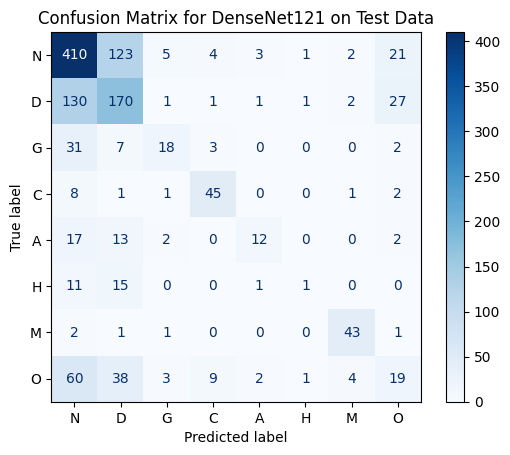

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

def evaluate_on_test_set(model, X_val, y_val, model_name):
    # Predict on Test data
    val_predictions = model.predict(X_val)
    predicted_labels = np.argmax(val_predictions, axis=1)
    true_labels = np.argmax(y_val, axis=1)

    # Classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    print(f"Classification Report for {model_name}:\n", report)

    # Confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(8, 8))
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {model_name} on Test Data')
    plt.show()


evaluate_on_test_set(model_vgg16, X_val, y_val, 'VGG16')
evaluate_on_test_set(model_vgg19, X_val, y_val, 'VGG19')
evaluate_on_test_set(model_resnet50, X_val, y_val, 'ResNet50')
evaluate_on_test_set(model_densenet121, X_val, y_val, 'DenseNet121')


Test Predictions on Images

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step
Saved predictions for VGG16
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step
Saved predictions for VGG19
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 171ms/step
Saved predictions for ResNet50
32/32 ━━━━━━━━━━━━━━━━━━━━ 15s 286ms/step
Saved predictions for DenseNet121


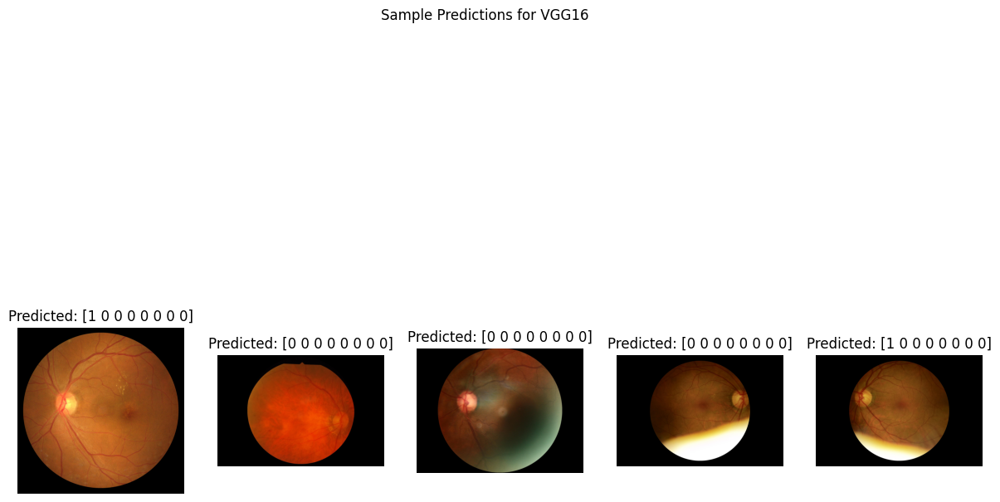

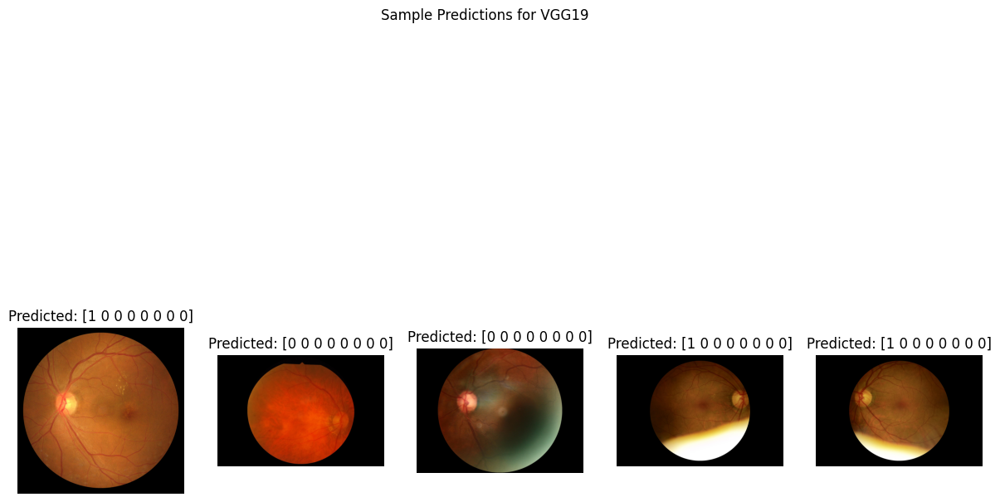

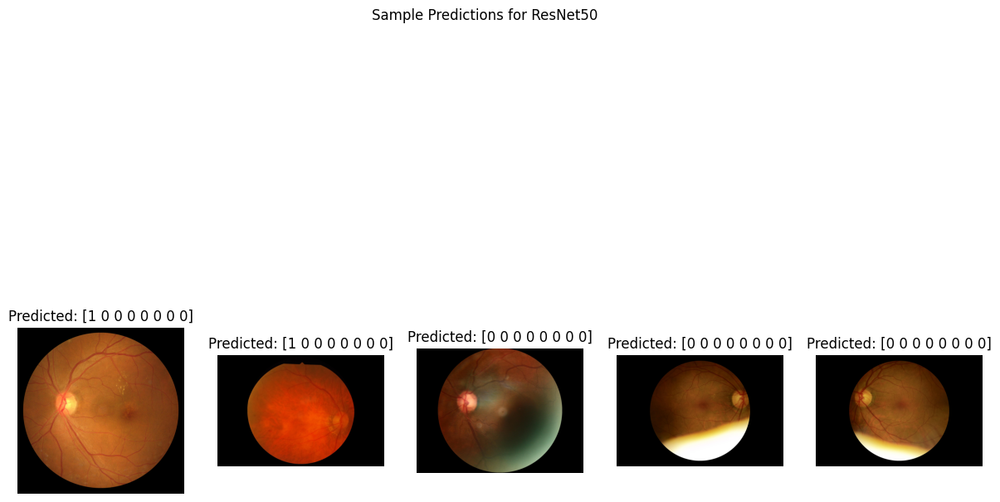

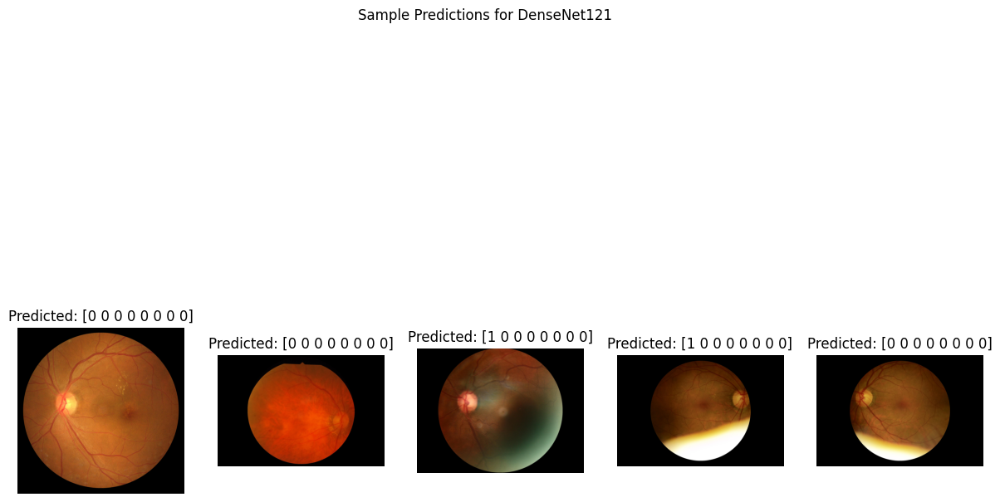

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os

# Load the saved models
model_vgg16 = tf.keras.models.load_model('vgg16_model.keras')
model_vgg19 = tf.keras.models.load_model('vgg19_model.keras')
model_resnet50 = tf.keras.models.load_model('resnet50_model.keras')
model_densenet121 = tf.keras.models.load_model('densenet121_model.keras')

# Function to predict and save results
def predict_and_save_results(model, model_name, test_dataset, test_image_paths):
    # Predict on the test dataset
    predictions = model.predict(test_dataset)

    # Convert predictions to labels (binary)
    predicted_labels = (predictions > 0.5).astype(int)

    # Save the predictions with filenames
    results = []
    for i, img_path in enumerate(test_image_paths):
        result = {
            "image": os.path.basename(img_path),
            "predicted_labels": predicted_labels[i]
        }
        results.append(result)

    # Save to a file
    np.save(f'{model_name}_predictions.npy', results)
    print(f"Saved predictions for {model_name}")

# Make predictions for each model
predict_and_save_results(model_vgg16, 'VGG16', test_dataset, test_image_paths)
predict_and_save_results(model_vgg19, 'VGG19', test_dataset, test_image_paths)
predict_and_save_results(model_resnet50, 'ResNet50', test_dataset, test_image_paths)
predict_and_save_results(model_densenet121, 'DenseNet121', test_dataset, test_image_paths)

# Function to visualize predictions
def visualize_predictions(model_name, num_samples=5):
    # Load the predictions
    results = np.load(f'{model_name}_predictions.npy', allow_pickle=True)

    plt.figure(figsize=(15, 10))

    # Display a few samples
    for i in range(num_samples):
        img_info = results[i]
        img = plt.imread(os.path.join(test_images_dir, img_info["image"]))
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.title(f"Predicted: {img_info['predicted_labels']}")
        plt.axis('off')

    plt.suptitle(f'Sample Predictions for {model_name}')
    plt.show()

# Visualize predictions for VGG16
visualize_predictions('VGG16')

# Repeat for other models if needed
visualize_predictions('VGG19')
visualize_predictions('ResNet50')
visualize_predictions('DenseNet121')


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam

# Load VGG19 model
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

# Build the VGG19 model
model_vgg19 = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='sigmoid')
])

# Compile the model
model_vgg19.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Train the VGG16 model
history_vgg19 = model_vgg19.fit(
    X_train, y_train,
    batch_size=32,
    epochs=200,
    validation_data=(X_val, y_val)
)


Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 37s 214ms/step - accuracy: 0.3830 - loss: 0.3826 - val_accuracy: 0.4511 - val_loss: 0.2841
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 188ms/step - accuracy: 0.4166 - loss: 0.3191 - val_accuracy: 0.4668 - val_loss: 0.2762
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 186ms/step - accuracy: 0.4415 - loss: 0.3068 - val_accuracy: 0.4816 - val_loss: 0.2703
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 189ms/step - accuracy: 0.4566 - loss: 0.2957 - val_accuracy: 0.4871 - val_loss: 0.2688
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 188ms/step - accuracy: 0.4531 - loss: 0.2910 - val_accuracy: 0.4832 - val_loss: 0.2657
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 187ms/step - accuracy: 0.4604 - loss: 0.2894 - val_accuracy: 0.4918 - val_loss: 0.2645
Epoch 7/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 188ms/step - accuracy: 0.4721 - loss: 0.2828 - val_accuracy: 0.5090 - val_loss: 0.2623
Epoch 8/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 189ms/step - accuracy: 0.4797 -

In [ ]:
from sklearn.metrics import classification_report

# Evaluate the model
val_loss, val_acc = model_vgg19.evaluate(X_val, y_val)
print("Validation loss for VGG19:", val_loss)
print("Validation accuracy for VGG19:", val_acc)

# Make predictions on the validation set
y_pred = model_vgg19.predict(X_val)
y_pred_binary = (y_pred > 0.5).astype(int)

# Generate a classification report
report = classification_report(y_val, y_pred_binary, target_names=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'])
print("Classification report for VGG19:")
print(report)


40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.5261 - loss: 0.2773
Validation loss for VGG19: 0.28903183341026306
Validation accuracy for VGG19: 0.5121188163757324
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step
Classification report for VGG19:
              precision    recall  f1-score   support

           N       0.68      0.38      0.49       569
           D       0.47      0.38      0.42       333
           G       0.40      0.13      0.20        61
           C       0.66      0.60      0.63        58
           A       0.00      0.00      0.00        46
           H       1.00      0.04      0.07        28
           M       0.86      0.67      0.75        48
           O       0.33      0.02      0.04       136

   micro avg       0.60      0.33      0.43      1279
   macro avg       0.55      0.28      0.33      1279
weighted avg       0.56      0.33      0.40      1279
 samples avg       0.33      0.33      0.33      1279



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch	Train Accuracy	Val Accuracy	Train Loss	Val Loss
1	0.4017		0.4511		0.3432		0.2841
2	0.4146		0.4668		0.3164		0.2762
3	0.4516		0.4816		0.3018		0.2703
4	0.4565		0.4871		0.2943		0.2688
5	0.4614		0.4832		0.2901		0.2657
6	0.4659		0.4918		0.2867		0.2645
7	0.4743		0.5090		0.2822		0.2623
8	0.4749		0.4988		0.2811		0.2610
9	0.4850		0.4918		0.2754		0.2605
10	0.4809		0.5020		0.2727		0.2578
11	0.5024		0.4980		0.2701		0.2594
12	0.4966		0.5090		0.2685		0.2581
13	0.4989		0.5035		0.2677		0.2566
14	0.4976		0.5035		0.2661		0.2566
15	0.4979		0.5059		0.2646		0.2543
16	0.4989		0.5074		0.2639		0.2538
17	0.5120		0.5184		0.2601		0.2547
18	0.5060		0.5293		0.2598		0.2540
19	0.5097		0.5238		0.2581		0.2535
20	0.5099		0.5184		0.2582		0.2520
21	0.5177		0.5231		0.2555		0.2535
22	0.5163		0.5246		0.2550		0.2524
23	0.5101		0.5020		0.2552		0.2560
24	0.5224		0.5270		0.2526		0.2530
25	0.5249		0.5059		0.2511		0.2538
26	0.5304		0.5145		0.2489		0.2526
27	0.5277		0.5278		0.2501		0.2545
28	0.5230		0.4941		0.2494		0.2613
29	

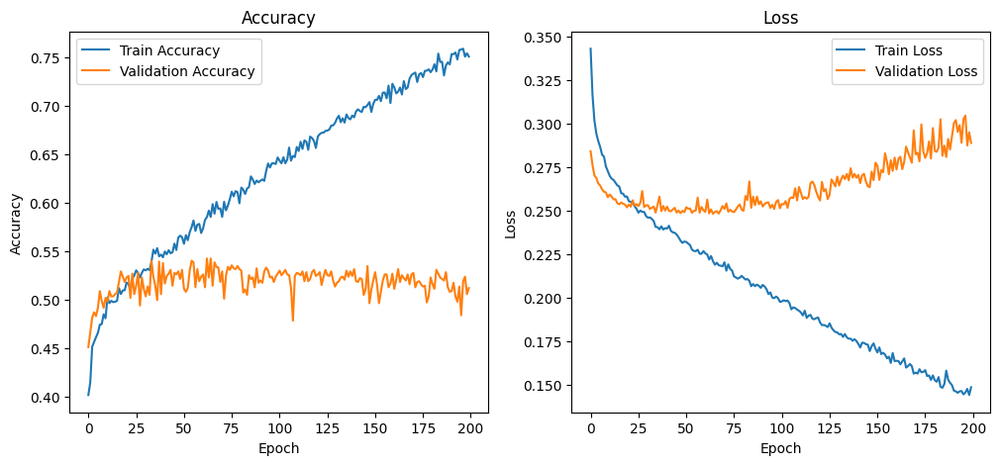

40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 135ms/step


<Figure size 800x800 with 0 Axes>

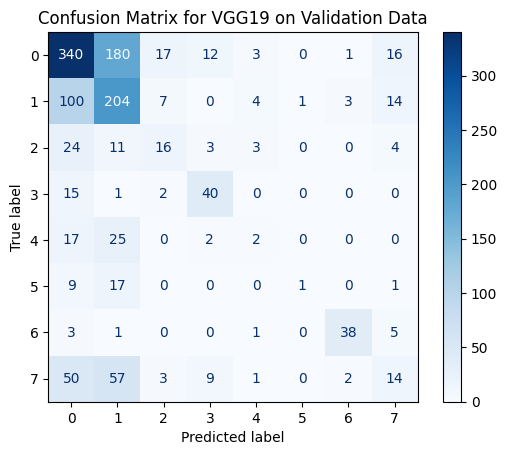

Confusion Matrix:
[[340 180  17  12   3   0   1  16]
 [100 204   7   0   4   1   3  14]
 [ 24  11  16   3   3   0   0   4]
 [ 15   1   2  40   0   0   0   0]
 [ 17  25   0   2   2   0   0   0]
 [  9  17   0   0   0   1   0   1]
 [  3   1   0   0   1   0  38   5]
 [ 50  57   3   9   1   0   2  14]]


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get the training and validation accuracy from the history object
train_acc = history_vgg19.history['accuracy']
val_acc = history_vgg19.history['val_accuracy']

# Get the training and validation loss
train_loss = history_vgg19.history['loss']
val_loss = history_vgg19.history['val_loss']

# Print the training and validation accuracy and loss
print("Epoch\tTrain Accuracy\tVal Accuracy\tTrain Loss\tVal Loss")
for epoch in range(len(train_acc)):
    print(f"{epoch + 1}\t{train_acc[epoch]:.4f}\t\t{val_acc[epoch]:.4f}\t\t{train_loss[epoch]:.4f}\t\t{val_loss[epoch]:.4f}")

# Optional: Plot the accuracy and loss
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(train_acc, label='Train Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')

plt.show()

# Predict the validation data
val_predictions = model_vgg19.predict(X_val)
predicted_labels = np.argmax(val_predictions, axis=1)
true_labels = np.argmax(y_val, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot(cmap=plt.cm.Blues, values_format='g')
plt.title('Confusion Matrix for VGG19 on Validation Data')
plt.show()

print("Confusion Matrix:")
print(conf_matrix)


In [ ]:
# Save the trained model
model_vgg19.save('vgg19_model.keras')


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam

# Load Resnet model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

# Build the ResNet50 model
model_ResNet50 = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='sigmoid')  # 8 output neurons for multi-label classification
])

# Compile the model
model_ResNet50.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Train the VGG16 model
history_ResNet50 = model_ResNet50.fit(
    X_train, y_train,
    batch_size=32,
    epochs=200,
    validation_data=(X_val, y_val)
)


Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 43s 187ms/step - accuracy: 0.3367 - loss: 0.4011 - val_accuracy: 0.4449 - val_loss: 0.3055
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - accuracy: 0.3909 - loss: 0.3406 - val_accuracy: 0.4480 - val_loss: 0.3001
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step - accuracy: 0.4135 - loss: 0.3369 - val_accuracy: 0.4504 - val_loss: 0.2970
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - accuracy: 0.4260 - loss: 0.3301 - val_accuracy: 0.4488 - val_loss: 0.2993
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 104ms/step - accuracy: 0.4215 - loss: 0.3280 - val_accuracy: 0.4488 - val_loss: 0.2982
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - accuracy: 0.4251 - loss: 0.3279 - val_accuracy: 0.4449 - val_loss: 0.2992
Epoch 7/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - accuracy: 0.4215 - loss: 0.3286 - val_accuracy: 0.4449 - val_loss: 0.2975
Epoch 8/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - accuracy: 0.4383 -

In [ ]:
from sklearn.metrics import classification_report

# Evaluate the model
val_loss, val_acc = model_ResNet50.evaluate(X_val, y_val)
print("Validation loss for ResNet50:", val_loss)
print("Validation accuracy for ResNet50:", val_acc)

# Make predictions on the validation set
y_pred = model_ResNet50.predict(X_val)
y_pred_binary = (y_pred > 0.5).astype(int)

# Generate a classification report
report = classification_report(y_val, y_pred_binary, target_names=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'])
print("Classification report for ResNet:")
print(report)


40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.4844 - loss: 0.2720
Validation loss for ResNet50: 0.281310498714447
Validation accuracy for ResNet50: 0.4667709171772003
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step
Classification report for ResNet:
              precision    recall  f1-score   support

           N       0.62      0.27      0.38       569
           D       0.00      0.00      0.00       333
           G       0.00      0.00      0.00        61
           C       0.60      0.05      0.10        58
           A       0.00      0.00      0.00        46
           H       0.00      0.00      0.00        28
           M       0.91      0.21      0.34        48
           O       0.00      0.00      0.00       136

   micro avg       0.63      0.13      0.22      1279
   macro avg       0.27      0.07      0.10      1279
weighted avg       0.34      0.13      0.19      1279
 samples avg       0.13      0.13      0.13      1279



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch	Train Accuracy	Val Accuracy	Train Loss	Val Loss
1	0.3693		0.4449		0.3618		0.3055
2	0.3923		0.4480		0.3406		0.3001
3	0.4156		0.4504		0.3353		0.2970
4	0.4213		0.4488		0.3311		0.2993
5	0.4172		0.4488		0.3297		0.2982
6	0.4256		0.4449		0.3285		0.2992
7	0.4324		0.4449		0.3271		0.2975
8	0.4401		0.4441		0.3212		0.2964
9	0.4399		0.4496		0.3232		0.2976
10	0.4453		0.4480		0.3204		0.2967
11	0.4434		0.4472		0.3187		0.2966
12	0.4477		0.4449		0.3208		0.2961
13	0.4457		0.4496		0.3184		0.2983
14	0.4453		0.4496		0.3192		0.2953
15	0.4506		0.4511		0.3185		0.2952
16	0.4487		0.4480		0.3177		0.2966
17	0.4522		0.4457		0.3148		0.2950
18	0.4530		0.4480		0.3145		0.2961
19	0.4512		0.4488		0.3147		0.2943
20	0.4508		0.4488		0.3133		0.2965
21	0.4516		0.4464		0.3148		0.2961
22	0.4530		0.4496		0.3151		0.2979
23	0.4535		0.4488		0.3107		0.2946
24	0.4524		0.4472		0.3140		0.2999
25	0.4539		0.4543		0.3131		0.2934
26	0.4524		0.4496		0.3128		0.2966
27	0.4551		0.4480		0.3116		0.2935
28	0.4534		0.4527		0.3109		0.2969
29	

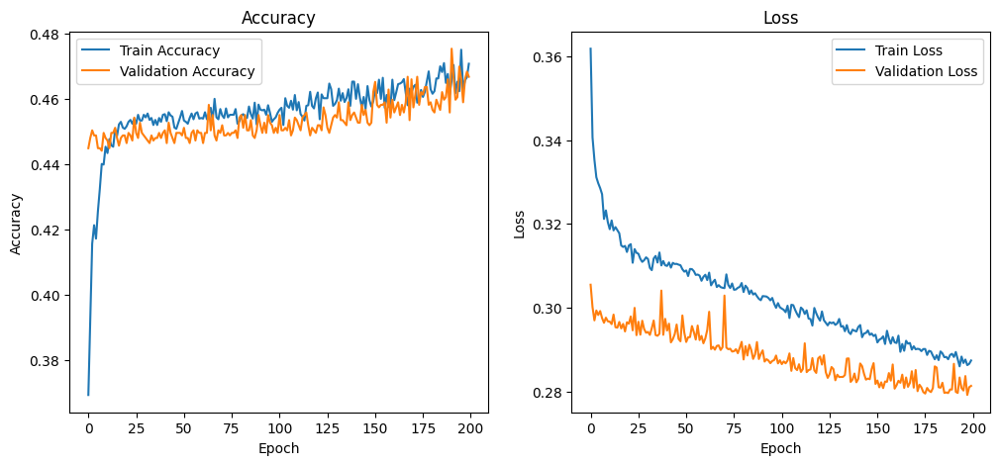

40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step


<Figure size 800x800 with 0 Axes>

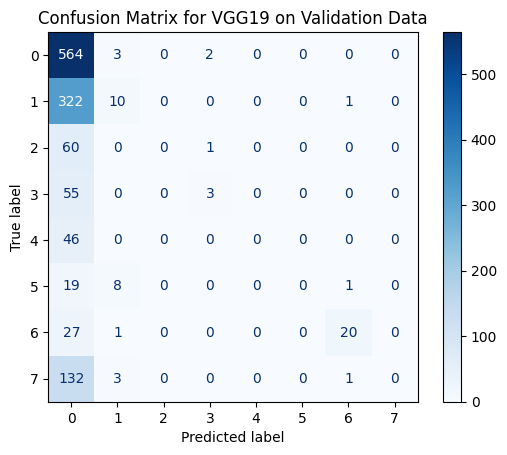

Confusion Matrix:
[[564   3   0   2   0   0   0   0]
 [322  10   0   0   0   0   1   0]
 [ 60   0   0   1   0   0   0   0]
 [ 55   0   0   3   0   0   0   0]
 [ 46   0   0   0   0   0   0   0]
 [ 19   8   0   0   0   0   1   0]
 [ 27   1   0   0   0   0  20   0]
 [132   3   0   0   0   0   1   0]]


In [ ]:
import matplotlib.pyplot as plt

# Get the training and validation accuracy from the history object
train_acc = history_ResNet50.history['accuracy']
val_acc = history_ResNet50.history['val_accuracy']

# Get the training and validation loss
train_loss = history_ResNet50.history['loss']
val_loss = history_ResNet50.history['val_loss']

# Print the training and validation accuracy and loss
print("Epoch\tTrain Accuracy\tVal Accuracy\tTrain Loss\tVal Loss")
for epoch in range(len(train_acc)):
    print(f"{epoch + 1}\t{train_acc[epoch]:.4f}\t\t{val_acc[epoch]:.4f}\t\t{train_loss[epoch]:.4f}\t\t{val_loss[epoch]:.4f}")

# Optional: Plot the accuracy and loss
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(train_acc, label='Train Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')

plt.show()



# Predict the validation data
val_predictions = model_ResNet50.predict(X_val)
predicted_labels = np.argmax(val_predictions, axis=1)
true_labels = np.argmax(y_val, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot(cmap=plt.cm.Blues, values_format='g')
plt.title('Confusion Matrix for VGG19 on Validation Data')
plt.show()

print("Confusion Matrix:")
print(conf_matrix)

In [ ]:
# Save the trained model
model_ResNet50.save('ResNet50_model.keras')


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam

# Load Resnet model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

# Build the ResNet50 model
model_DenseNet121 = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='sigmoid')  # 8 output neurons for multi-label classification
])

# Compile the model
model_DenseNet121.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Train the DenseNet121 model
history_DenseNet121 = model_DenseNet121.fit(
    X_train, y_train,
    batch_size=32,
    epochs=200,
    validation_data=(X_val, y_val)
)


Epoch 1/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 70s 282ms/step - accuracy: 0.3721 - loss: 0.4561 - val_accuracy: 0.5199 - val_loss: 0.2586
Epoch 2/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - accuracy: 0.4790 - loss: 0.3007 - val_accuracy: 0.5332 - val_loss: 0.2478
Epoch 3/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - accuracy: 0.4974 - loss: 0.2884 - val_accuracy: 0.5637 - val_loss: 0.2393
Epoch 4/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - accuracy: 0.5232 - loss: 0.2736 - val_accuracy: 0.5504 - val_loss: 0.2385
Epoch 5/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - accuracy: 0.5180 - loss: 0.2640 - val_accuracy: 0.5450 - val_loss: 0.2432
Epoch 6/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - accuracy: 0.5626 - loss: 0.2524 - val_accuracy: 0.5575 - val_loss: 0.2359
Epoch 7/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - accuracy: 0.5614 - loss: 0.2476 - val_accuracy: 0.5645 - val_loss: 0.2384
Epoch 8/200
160/160 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - accuracy: 0.5805 - loss: 

In [ ]:
from sklearn.metrics import classification_report

# Evaluate the model
val_loss, val_acc = model_DenseNet121.evaluate(X_val, y_val)
print("Validation loss for DenseNet121:", val_loss)
print("Validation accuracy for DenseNet121:", val_acc)

# Make predictions on the validation set
y_pred = model_DenseNet121.predict(X_val)
y_pred_binary = (y_pred > 0.5).astype(int)

# Generate a classification report
report = classification_report(y_val, y_pred_binary, target_names=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'])
print("Classification report for ResNet:")
print(report)


40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5793 - loss: 0.4891
Validation loss for DenseNet121: 0.529312252998352
Validation accuracy for DenseNet121: 0.5582486391067505
40/40 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step
Classification report for ResNet:
              precision    recall  f1-score   support

           N       0.65      0.60      0.62       569
           D       0.58      0.25      0.35       333
           G       0.86      0.10      0.18        61
           C       0.73      0.69      0.71        58
           A       0.00      0.00      0.00        46
           H       1.00      0.04      0.07        28
           M       0.86      0.67      0.75        48
           O       0.26      0.07      0.11       136

   micro avg       0.64      0.40      0.49      1279
   macro avg       0.62      0.30      0.35      1279
weighted avg       0.60      0.40      0.45      1279
 samples avg       0.40      0.40      0.40      1279



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch	Train Accuracy	Val Accuracy	Train Loss	Val Loss
1	0.4236		0.5199		0.3589		0.2586
2	0.4708		0.5332		0.3014		0.2478
3	0.4999		0.5637		0.2864		0.2393
4	0.5236		0.5504		0.2715		0.2385
5	0.5249		0.5450		0.2635		0.2432
6	0.5502		0.5575		0.2550		0.2359
7	0.5635		0.5645		0.2461		0.2384
8	0.5725		0.5880		0.2444		0.2327
9	0.5738		0.5692		0.2373		0.2338
10	0.5775		0.5731		0.2347		0.2333
11	0.5975		0.5684		0.2285		0.2318
12	0.5959		0.5676		0.2245		0.2291
13	0.6049		0.5856		0.2207		0.2303
14	0.6079		0.5919		0.2193		0.2316
15	0.6173		0.5676		0.2145		0.2370
16	0.6194		0.5731		0.2105		0.2340
17	0.6296		0.5715		0.2091		0.2347
18	0.6378		0.5692		0.2055		0.2374
19	0.6292		0.5708		0.2068		0.2296
20	0.6442		0.5817		0.1996		0.2383
21	0.6489		0.5786		0.1978		0.2373
22	0.6509		0.5770		0.1971		0.2336
23	0.6626		0.5653		0.1908		0.2411
24	0.6699		0.5801		0.1881		0.2352
25	0.6744		0.5825		0.1848		0.2427
26	0.6728		0.5637		0.1839		0.2420
27	0.6857		0.5762		0.1798		0.2399
28	0.6927		0.5809		0.1780		0.2367
29	

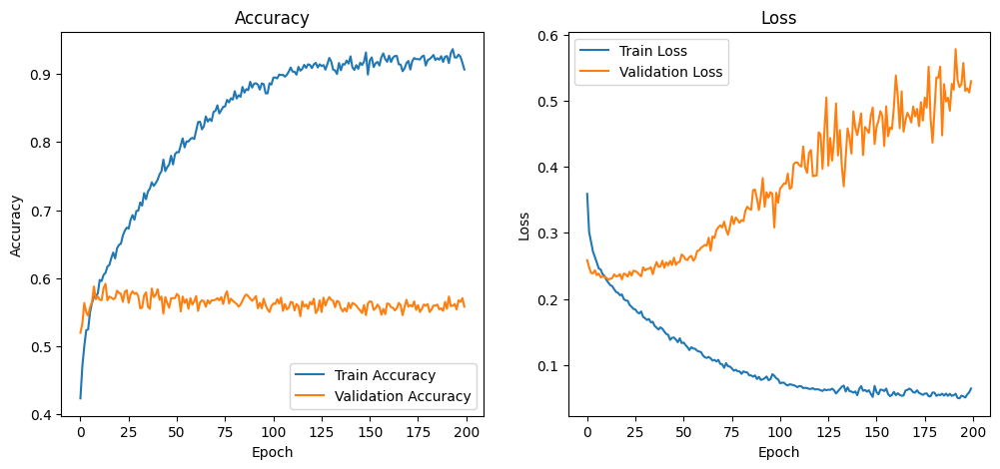

40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step


<Figure size 800x800 with 0 Axes>

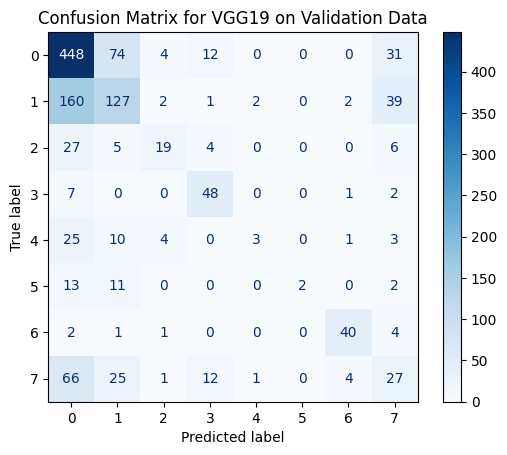

Confusion Matrix:
[[448  74   4  12   0   0   0  31]
 [160 127   2   1   2   0   2  39]
 [ 27   5  19   4   0   0   0   6]
 [  7   0   0  48   0   0   1   2]
 [ 25  10   4   0   3   0   1   3]
 [ 13  11   0   0   0   2   0   2]
 [  2   1   1   0   0   0  40   4]
 [ 66  25   1  12   1   0   4  27]]


In [ ]:
import matplotlib.pyplot as plt

# Get the training and validation accuracy from the history object
train_acc = history_DenseNet121.history['accuracy']
val_acc = history_DenseNet121.history['val_accuracy']

# Get the training and validation loss
train_loss = history_DenseNet121.history['loss']
val_loss = history_DenseNet121.history['val_loss']

# Print the training and validation accuracy and loss
print("Epoch\tTrain Accuracy\tVal Accuracy\tTrain Loss\tVal Loss")
for epoch in range(len(train_acc)):
    print(f"{epoch + 1}\t{train_acc[epoch]:.4f}\t\t{val_acc[epoch]:.4f}\t\t{train_loss[epoch]:.4f}\t\t{val_loss[epoch]:.4f}")

# Optional: Plot the accuracy and loss
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(train_acc, label='Train Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')

plt.show()

# Predict the validation data
val_predictions = model_DenseNet121.predict(X_val)
predicted_labels = np.argmax(val_predictions, axis=1)
true_labels = np.argmax(y_val, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot(cmap=plt.cm.Blues, values_format='g')
plt.title('Confusion Matrix for VGG19 on Validation Data')
plt.show()

print("Confusion Matrix:")
print(conf_matrix)


In [ ]:
# Save the trained model
model_DenseNet121.save('DenseNet121_model.keras')


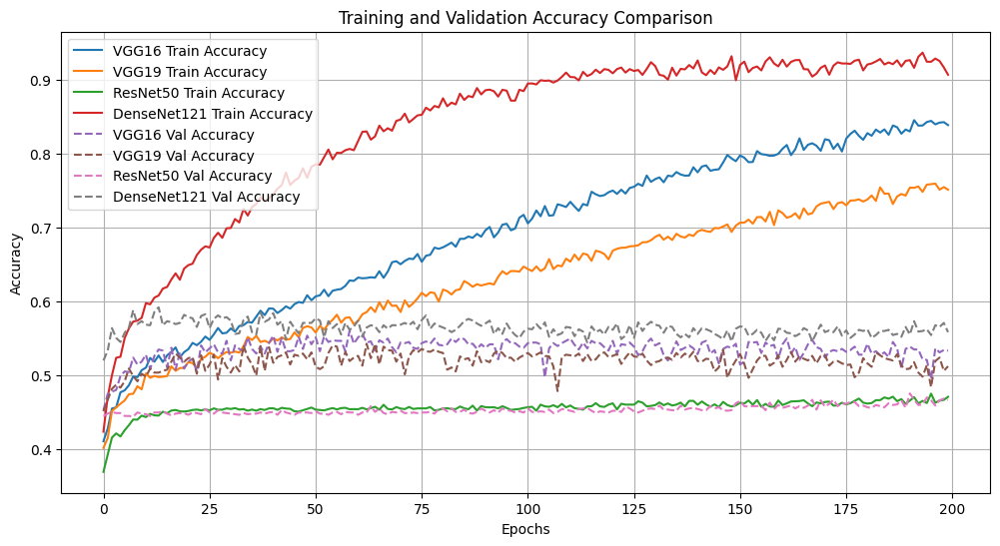

In [ ]:
import matplotlib.pyplot as plt

# Plot training accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_vgg16.history['accuracy'], label='VGG16 Train Accuracy')
plt.plot(history_vgg19.history['accuracy'], label='VGG19 Train Accuracy')
plt.plot(history_ResNet50.history['accuracy'], label='ResNet50 Train Accuracy')
plt.plot(history_DenseNet121.history['accuracy'], label='DenseNet121 Train Accuracy')

# Plot validation accuracy
plt.plot(history_vgg16.history['val_accuracy'], label='VGG16 Val Accuracy', linestyle='dashed')
plt.plot(history_vgg19.history['val_accuracy'], label='VGG19 Val Accuracy', linestyle='dashed')
plt.plot(history_ResNet50.history['val_accuracy'], label='ResNet50 Val Accuracy', linestyle='dashed')
plt.plot(history_DenseNet121.history['val_accuracy'], label='DenseNet121 Val Accuracy', linestyle='dashed')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy Comparison')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import os

# Check contents of the directory
test_images_path = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Testing Images'
print(os.listdir(test_images_path))


['4075_right.jpg', '4666_left.jpg', '3506_left.jpg', '1338_left.jpg', '1057_left.jpg', '3575_left.jpg', '4663_right.jpg', '3473_right.jpg', '4652_right.jpg', '1047_right.jpg', '4710_right.jpg', '3529_right.jpg', '3544_right.jpg', '1920_right.jpg', '3598_left.jpg', '1363_left.jpg', '3525_right.jpg', '1449_right.jpg', '4733_left.jpg', '1979_left.jpg', '3514_right.jpg', '1457_left.jpg', '1385_right.jpg', '1679_left.jpg', '1078_right.jpg', '4718_right.jpg', '3499_right.jpg', '3516_right.jpg', '4707_right.jpg', '2043_right.jpg', '1407_right.jpg', '1998_left.jpg', '1931_right.jpg', '1055_right.jpg', '3452_left.jpg', '2021_left.jpg', '1199_left.jpg', '4751_left.jpg', '2257_left.jpg', '1524_left.jpg', '4692_right.jpg', '2071_left.jpg', '1703_right.jpg', '1063_left.jpg', '4747_right.jpg', '3564_left.jpg', '3585_right.jpg', '3600_left.jpg', '3514_left.jpg', '3577_left.jpg', '4722_left.jpg', '1960_right.jpg', '3530_left.jpg', '1379_left.jpg', '995_right.jpg', '1244_right.jpg', '3544_left.jpg', '2

In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array


# Get a list of all image files in the directory
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Define image size (same as model input size)
target_size = (224, 224)  # Adjust if your model expects a different size

# Load and preprocess images
images = []
for file in image_files:
    img_path = os.path.join(test_images_path, file)
    img = load_img(img_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = img_array / 255.0  # Rescale the image
    images.append(img_array)

# Convert list to numpy array
X_test = np.array(images)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
import numpy as np

# Create and save a simple model
simple_model = Sequential([
    Flatten(input_shape=(28, 28)),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')
])

simple_model.save('/content/simple_model.keras')

# Load the simple model
loaded_model = load_model('/content/simple_model.keras')

# Test prediction
X_test_simple = np.random.rand(10, 28, 28)  # Example data
predictions = loaded_model.predict(X_test_simple)
print(predictions)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
[[0.0251751  0.08611417 0.06172148 0.0322479  0.13490495 0.11344338
  0.17592323 0.07344081 0.22973333 0.06729557]
 [0.02946158 0.1067546  0.0642522  0.0499155  0.16835651 0.05740337
  0.05901682 0.13243961 0.27947658 0.05292321]
 [0.0281063  0.03376088 0.1156256  0.02891007 0.24182495 0.08536123
  0.15309691 0.05392894 0.16330825 0.09607678]
 [0.0164501  0.03160483 0.10452916 0.02641335 0.14798911 0.13622618
  0.06799243 0.09193461 0.33787382 0.03898642]
 [0.02787858 0.07738812 0.09568925 0.11190706 0.14791782 0.14183527
  0.07798671 0.09860997 0.12199462 0.09879266]
 [0.02152496 0.0673202  0.08321904 0.04937742 0.22042458 0.1295997
  0.06969253 0.08142857 0.21964344 0.05776957]
 [0.02368264 0.0825481  0.13503581 0.04455034 0.15047975 0.10583237
  0.05775578 0.05628281 0.26515833 0.07867397]
 [0.03243969 0.05733711 0.13714181 0.04194822 0.12865016 0.11979076
  0.07803878 0.07817664 0.2623616  0.06411523]
 [0.02729477 0.03936004 0.13276754 0.02910

In [ ]:
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, DenseNet121
from tensorflow.keras.models import save_model

# Re-load or create models
model_vgg16 = VGG16(weights='imagenet', input_shape=(224, 224, 3))
model_vgg19 = VGG19(weights='imagenet', input_shape=(224, 224, 3))
model_resnet50 = ResNet50(weights='imagenet', input_shape=(224, 224, 3))
model_densenet121 = DenseNet121(weights='imagenet', input_shape=(224, 224, 3))

# Save models
model_vgg16.save('/content/VGG16_model_new.keras')
model_vgg19.save('/content/VGG19_model_new.keras')
model_resnet50.save('/content/ResNet50_model_new.keras')
model_densenet121.save('/content/DenseNet121_model_new.keras')


553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 26s 0us/step
574710816/574710816 ━━━━━━━━━━━━━━━━━━━━ 25s 0us/step
102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step
33188688/33188688 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
from tensorflow.keras.models import load_model

# File paths for the saved models
vgg16_model_path = '/content/VGG16_model_new.keras'
vgg19_model_path = '/content/VGG19_model_new.keras'
resnet50_model_path = '/content/ResNet50_model_new.keras'
densenet121_model_path = '/content/DenseNet121_model_new.keras'

# Load the models
try:
    model_vgg16 = load_model(vgg16_model_path)
    print("VGG16 model loaded successfully.")
except Exception as e:
    print(f"Error loading VGG16 model: {e}")

try:
    model_vgg19 = load_model(vgg19_model_path)
    print("VGG19 model loaded successfully.")
except Exception as e:
    print(f"Error loading VGG19 model: {e}")

try:
    model_resnet50 = load_model(resnet50_model_path)
    print("ResNet50 model loaded successfully.")
except Exception as e:
    print(f"Error loading ResNet50 model: {e}")

try:
    model_densenet121 = load_model(densenet121_model_path)
    print("DenseNet121 model loaded successfully.")
except Exception as e:
    print(f"Error loading DenseNet121 model: {e}")


VGG16 model loaded successfully.
VGG19 model loaded successfully.
ResNet50 model loaded successfully.
DenseNet121 model loaded successfully.


In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.vgg19 import preprocess_input as preprocess_vgg19
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet50
from tensorflow.keras.applications.densenet import preprocess_input as preprocess_densenet

# Define a function to load and preprocess test images
def load_and_preprocess_image(img_path, target_size, preprocess_fn):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_fn(img_array)  # Apply model-specific preprocessing
    return img_array

# Path to the test images
test_images_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Testing Images'
test_image_files = ['4075_right.jpg', '4666_left.jpg', '3506_left.jpg']  # Example image files
test_image_paths = [os.path.join(test_images_dir, img_file) for img_file in test_image_files]

# Preprocess all test images
preprocessed_images_vgg16 = [load_and_preprocess_image(img_path, target_size=(224, 224), preprocess_fn=preprocess_vgg16) for img_path in test_image_paths]
preprocessed_images_vgg19 = [load_and_preprocess_image(img_path, target_size=(224, 224), preprocess_fn=preprocess_vgg19) for img_path in test_image_paths]
preprocessed_images_resnet50 = [load_and_preprocess_image(img_path, target_size=(224, 224), preprocess_fn=preprocess_resnet50) for img_path in test_image_paths]
preprocessed_images_densenet121 = [load_and_preprocess_image(img_path, target_size=(224, 224), preprocess_fn=preprocess_densenet) for img_path in test_image_paths]

preprocessed_images_vgg16 = np.vstack(preprocessed_images_vgg16)
preprocessed_images_vgg19 = np.vstack(preprocessed_images_vgg19)
preprocessed_images_resnet50 = np.vstack(preprocessed_images_resnet50)
preprocessed_images_densenet121 = np.vstack(preprocessed_images_densenet121)


In [ ]:
from tensorflow.keras.models import load_model

# Paths to saved models
model_paths = {
    'vgg16': '/content/VGG16_model_new.keras',
    'vgg19': '/content/VGG19_model_new.keras',
    'resnet50': '/content/ResNet50_model_new.keras',
    'densenet121': '/content/DenseNet121_model_new.keras'
}

# Load the models
models = {name: load_model(path) for name, path in model_paths.items()}

# Function to make predictions
def get_predictions(model, images):
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)
    return predicted_classes, predictions

# Get predictions for each model
predictions_vgg16, probs_vgg16 = get_predictions(models['vgg16'], preprocessed_images_vgg16)
predictions_vgg19, probs_vgg19 = get_predictions(models['vgg19'], preprocessed_images_vgg19)
predictions_resnet50, probs_resnet50 = get_predictions(models['resnet50'], preprocessed_images_resnet50)
predictions_densenet121, probs_densenet121 = get_predictions(models['densenet121'], preprocessed_images_densenet121)

# Print out the probabilities for each model
print("VGG16 Predictions:", predictions_vgg16)
print("VGG16 Probabilities:", probs_vgg16)

print("VGG19 Predictions:", predictions_vgg19)
print("VGG19 Probabilities:", probs_vgg19)

print("ResNet50 Predictions:", predictions_resnet50)
print("ResNet50 Probabilities:", probs_resnet50)

print("DenseNet121 Predictions:", predictions_densenet121)
print("DenseNet121 Probabilities:", probs_densenet121)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
VGG16 Predictions: [107 950 107]
VGG16 Probabilities: [[1.09869525e-05 1.60673269e-04 1.84964665e-05 ... 1.14895221e-04
  1.27850682e-04 1.57499991e-04]
 [7.56057261e-06 1.23797008e-03 8.05945092e-07 ... 2.58825067e-03
  9.89605091e-04 9.79934703e-06]
 [5.64515062e-07 1.29678956e-05 8.59293209e-07 ... 3.49480339e-04
  7.46091837e-06 2.28737354e-05]]
VGG19 Predictions: [107 950 107]
VGG19 Probabilities: [[1.3429426e-05 2.1294490e-04 5.0951653e-06 ... 1.3147196e-04
  3.2674256e-05 1.1092900e-04]
 [2.4469909e-05 6.0553383e-04 3.1496381e-06 ... 1.6183195e-03
  4.8157695e-04 7.9500742e-06]
 [2.2415613e-06 2.6478821e-05 2.5363402e-06 ... 9.9676184e-04
  1.7568993e-05 1.5105289e-05]]
ResNet50 Predictions: [619 107 577]
ResNet50 Probabilities: [[1.07187225e-06 5.48582502e-05 1.36980066e-06 ... 9.96842573e-06
  8.99887164e-06 1.73443565e-04]
 [1.6

In [ ]:
# Debugging predictions
print("Unique values in predictions:", np.unique(predictions_vgg16))
print("Max value in predictions:", np.max(predictions_vgg16))
print("Class names length:", len(class_names))


Unique values in predictions: [107 950]
Max value in predictions: 950
Class names length: 8


In [ ]:
print("Shape of predictions_vgg16:", np.shape(predictions_vgg16))
print("Shape of predictions_vgg19:", np.shape(predictions_vgg19))
print("Shape of predictions_resnet50:", np.shape(predictions_resnet50))
print("Shape of predictions_densenet121:", np.shape(predictions_densenet121))


Shape of predictions_vgg16: (3,)
Shape of predictions_vgg19: (3,)
Shape of predictions_resnet50: (3,)
Shape of predictions_densenet121: (3,)


In [ ]:
print("Indices VGG16 Type:", type(indices_vgg16))
print("Indices VGG16 Shape:", indices_vgg16.shape if hasattr(indices_vgg16, 'shape') else 'No Shape Attribute')
print("Indices VGG16:", indices_vgg16)


Indices VGG16 Type: <class 'numpy.ndarray'>
Indices VGG16 Shape: (3, 1000)
Indices VGG16: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
def get_predicted_indices_from_probabilities(predictions):
    return np.argmax(predictions, axis=1)  # Get the index of the highest probability for each image


indices_vgg16 = get_predicted_indices_from_probabilities(predictions_vgg16)
indices_vgg19 = get_predicted_indices_from_probabilities(predictions_vgg19)
indices_resnet50 = get_predicted_indices_from_probabilities(predictions_resnet50)
indices_densenet121 = get_predicted_indices_from_probabilities(predictions_densenet121)


In [ ]:
def convert_predictions_to_classes(indices, class_names):
    return [class_names[ind] for ind in indices]


In [ ]:
import numpy as np

# Check the type and shape of indices
def debug_indices(indices):
    print("Type of indices:", type(indices))
    print("Shape of indices:", np.shape(indices))
    print("Unique values in indices:", np.unique(indices))

debug_indices(indices_vgg16)
debug_indices(indices_vgg19)
debug_indices(indices_resnet50)
debug_indices(indices_densenet121)

# Function to convert indices to class names
def convert_predictions_to_classes(indices, class_names):
    if isinstance(indices, np.ndarray) and indices.ndim == 1:
        return [class_names[ind] for ind in indices]
    else:
        raise ValueError("Indices should be a 1D array of integer values.")

# Convert predictions to class names
try:
    predictions_vgg16_classes = convert_predictions_to_classes(indices_vgg16, class_names)
    predictions_vgg19_classes = convert_predictions_to_classes(indices_vgg19, class_names)
    predictions_resnet50_classes = convert_predictions_to_classes(indices_resnet50, class_names)
    predictions_densenet121_classes = convert_predictions_to_classes(indices_densenet121, class_names)

    print("VGG16 Class Predictions:", predictions_vgg16_classes)
    print("VGG19 Class Predictions:", predictions_vgg19_classes)
    print("ResNet50 Class Predictions:", predictions_resnet50_classes)
    print("DenseNet121 Class Predictions:", predictions_densenet121_classes)
except Exception as e:
    print("Error during conversion:", e)


Type of indices: <class 'numpy.ndarray'>
Shape of indices: (3, 1000)
Unique values in indices: [0]
Type of indices: <class 'numpy.ndarray'>
Shape of indices: (3, 1000)
Unique values in indices: [0]
Type of indices: <class 'numpy.ndarray'>
Shape of indices: (3, 1000)
Unique values in indices: [0]
Type of indices: <class 'numpy.ndarray'>
Shape of indices: (3, 1000)
Unique values in indices: [0]
Error during conversion: Indices should be a 1D array of integer values.


In [ ]:
from tensorflow.keras.models import load_model

# Paths to the saved models
vgg16_model_path = '/content/VGG16_model_new.keras'
vgg19_model_path = '/content/VGG19_model_new.keras'
resnet50_model_path = '/content/ResNet50_model_new.keras'
densenet121_model_path = '/content/DenseNet121_model_new.keras'

# Load the models
model_vgg16 = load_model(vgg16_model_path)
model_vgg19 = load_model(vgg19_model_path)
model_resnet50 = load_model(resnet50_model_path)
model_densenet121 = load_model(densenet121_model_path)


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def load_images_from_directory(directory, target_size=(224, 224)):
    images = []
    filenames = []
    for filename in os.listdir(directory):
        img_path = os.path.join(directory, filename)
        if os.path.isfile(img_path):
            img = load_img(img_path, target_size=target_size)
            img_array = img_to_array(img)
            images.append(img_array)
            filenames.append(filename)
    images = np.array(images) / 255.0  # Normalize images
    return images, filenames

# Load the images
test_images, test_filenames = load_images_from_directory(test_images_path)

print(f"Loaded {len(test_images)} images.")
print(f"Example image shape: {test_images[0].shape}")


Loaded 1000 images.
Example image shape: (224, 224, 3)


In [ ]:
# Make predictions
predictions_vgg16 = model_vgg16.predict(test_images)
predictions_vgg19 = model_vgg19.predict(test_images)
predictions_resnet50 = model_resnet50.predict(test_images)
predictions_densenet121 = model_densenet121.predict(test_images)

print(f"VGG16 predictions shape: {predictions_vgg16.shape}")
print(f"VGG19 predictions shape: {predictions_vgg19.shape}")
print(f"ResNet50 predictions shape: {predictions_resnet50.shape}")
print(f"DenseNet121 predictions shape: {predictions_densenet121.shape}")


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 16s 315ms/step
VGG16 predictions shape: (1000, 1000)
VGG19 predictions shape: (1000, 1000)
ResNet50 predictions shape: (1000, 1000)
DenseNet121 predictions shape: (1000, 1000)


In [ ]:
# Example of checking a few predictions
print("Example VGG16 predictions:", predictions_vgg16[:2])
print("Example VGG19 predictions:", predictions_vgg19[:2])
print("Example ResNet50 predictions:", predictions_resnet50[:2])
print("Example DenseNet121 predictions:", predictions_densenet121[:2])


Example VGG16 predictions: [[7.74617511e-05 1.66901434e-03 2.18092231e-04 ... 6.59505749e-05
  1.79850103e-04 6.84115440e-02]
 [7.97983303e-05 1.97342085e-03 2.15276508e-04 ... 1.00957404e-04
  2.09022794e-04 6.11854047e-02]]
Example VGG19 predictions: [[6.6534281e-05 1.3505694e-03 2.8779672e-04 ... 5.1007890e-05
  1.4558967e-04 7.0317619e-02]
 [6.2132771e-05 1.4898543e-03 2.8249455e-04 ... 6.2551051e-05
  1.5525919e-04 5.3695872e-02]]
Example ResNet50 predictions: [[1.5908579e-04 3.1072539e-04 5.6787481e-05 ... 1.3518423e-05
  1.3622850e-04 6.4691750e-04]
 [1.5300406e-04 3.0536822e-04 5.6331213e-05 ... 1.3432563e-05
  1.3532469e-04 6.6868978e-04]]
Example DenseNet121 predictions: [[1.05883544e-07 1.36112783e-06 2.23972336e-07 ... 8.24217022e-06
  1.80051666e-05 1.17799455e-05]
 [2.22237895e-06 6.69091532e-05 2.28886802e-06 ... 2.45625735e-04
  1.19828305e-03 1.47326673e-05]]


In [ ]:
# Assuming test_images is your input array of images
predictions_vgg16 = model_vgg16.predict(test_images)
predictions_vgg19 = model_vgg19.predict(test_images)
predictions_resnet50 = model_resnet50.predict(test_images)
predictions_densenet121 = model_densenet121.predict(test_images)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step


In [ ]:
from tensorflow.keras.models import load_model

# Load the models
model_vgg16 = load_model(vgg16_model_path)
model_vgg19 = load_model(vgg19_model_path)
model_resnet50 = load_model(resnet50_model_path)
model_densenet121 = load_model(densenet121_model_path)

# Verify the model architectures
print("VGG16 model summary:")
model_vgg16.summary()
print("VGG19 model summary:")
model_vgg19.summary()
print("ResNet50 model summary:")
model_resnet50.summary()
print("DenseNet121 model summary:")
model_densenet121.summary()


VGG16 model summary:


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

VGG19 model summary:


Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 143,667,240 (548.05 MB)

 Trainable params: 143,667,240 (548.05 MB)

 Non-trainable params: 0 (0.00 B)

ResNet50 model summary:


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_13[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

DenseNet121 model summary:


Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_4          │ (None, 230, 230, 3)    │              0 │ input_layer_14[0][0]   │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d_4[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_5          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_5[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 8,062,504 (30.76 MB)

 Trainable params: 7,978,856 (30.44 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [ ]:
import tensorflow as tf
import os

# Define the path to the test images directory
test_images_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Testing Images'

# List all image files in the directory
test_image_paths = [os.path.join(test_images_dir, fname) for fname in os.listdir(test_images_dir) if fname.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Verify that image paths are correctly listed
print(f"Found {len(test_image_paths)} image files.")

# Define a function to load and preprocess images
def load_and_preprocess_image(path):
    image = tf.io.read_file(path)
    image = tf.image.decode_image(image, channels=3, expand_animations=False)  # Ensure image has 3 channels
    image = tf.image.resize(image, [224, 224])
    image = image / 255.0  # Normalize to [0, 1]
    return image

# Create a dataset from the image paths
def process_image(path):
    image = load_and_preprocess_image(path)
    return image,  # Return a tuple with a single element

test_dataset = tf.data.Dataset.from_tensor_slices(test_image_paths)
test_dataset = test_dataset.map(process_image, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(1)  # Batch size of 1

# Get the number of images
num_test_images = len(test_image_paths)
print(f"Number of test images: {num_test_images}")


Found 1000 image files.
Number of test images: 1000


In [ ]:
# Create a dataset with batching
test_dataset = test_dataset.batch(32)  # Use a batch size of 32 or any suitable size
test_dataset = test_dataset.prefetch(tf.data.AUTOTUNE)


In [ ]:
from tensorflow.keras.models import load_model

# Paths to the saved models
vgg16_model_path = '/content/VGG16_model_new.keras'
vgg19_model_path = '/content/VGG19_model_new.keras'
resnet50_model_path = '/content/ResNet50_model_new.keras'
densenet121_model_path = '/content/DenseNet121_model_new.keras'

# Load models
model_vgg16 = load_model(vgg16_model_path)
model_vgg19 = load_model(vgg19_model_path)
model_resnet50 = load_model(resnet50_model_path)
model_densenet121 = load_model(densenet121_model_path)


In [ ]:
def load_and_preprocess_image(path):
    image = tf.io.read_file(path)
    image = tf.image.decode_image(image, channels=3, expand_animations=False)  # Ensure 3 channels
    image = tf.image.resize(image, [224, 224])
    image = image / 255.0  # Normalize
    return image

def process_image(path):
    image = load_and_preprocess_image(path)
    return image  # Return directly


In [ ]:
# Create and preprocess the dataset
test_dataset = tf.data.Dataset.from_tensor_slices(test_image_paths)
test_dataset = test_dataset.map(lambda path: (process_image(path),))  # Ensure it returns a tuple with a single element
test_dataset = test_dataset.batch(32)  # Batch size
test_dataset = test_dataset.prefetch(tf.data.AUTOTUNE)  # Prefetch for performance


In [ ]:
print("Shape of VGG16 predictions:", predictions_vgg16_binary.shape)
print("Shape of VGG19 predictions:", predictions_vgg19_binary.shape)
print("Shape of ResNet50 predictions:", predictions_resnet50_binary.shape)
print("Shape of DenseNet121 predictions:", predictions_densenet121_binary.shape)


Shape of VGG16 predictions: (1000, 1000)
Shape of VGG19 predictions: (1000, 1000)
Shape of ResNet50 predictions: (1000, 1000)
Shape of DenseNet121 predictions: (1000, 1000)


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

# Load base models without the top layer
def create_custom_model(base_model_class, weights_path, num_classes=8):
    base_model = base_model_class(weights=None, include_top=False, input_shape=(224, 224, 3))
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dense(num_classes, activation='sigmoid')(x)  # Change to 8 classes
    model = Model(inputs=base_model.input, outputs=x)
    model.load_weights(weights_path, by_name=True)  # Load weights into base layers
    return model

# Create custom models for each architecture
model_vgg16 = create_custom_model(VGG16, vgg16_model_path)
model_vgg19 = create_custom_model(VGG19, vgg19_model_path)
model_resnet50 = create_custom_model(ResNet50, resnet50_model_path)
model_densenet121 = create_custom_model(DenseNet121, densenet121_model_path)

# Compile the models
def compile_model(model):
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

compile_model(model_vgg16)
compile_model(model_vgg19)
compile_model(model_resnet50)
compile_model(model_densenet121)

# Model summaries to confirm changes
print("VGG16 model summary:")
model_vgg16.summary()

print("VGG19 model summary:")
model_vgg19.summary()

print("ResNet50 model summary:")
model_resnet50.summary()

print("DenseNet121 model summary:")
model_densenet121.summary()


In [ ]:
import pandas as pd
import numpy as np
import os
from sklearn.utils import class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt


In [ ]:
import pandas as pd
# Path to the CSV file
csv_file_path = '/content/drive/MyDrive/archive-2/full_df.csv'

# Load the CSV file
df = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
print(df.head())


   ID  Patient Age Patient Sex Left-Fundus Right-Fundus  \
0   0           69      Female  0_left.jpg  0_right.jpg   
1   1           57        Male  1_left.jpg  1_right.jpg   
2   2           42        Male  2_left.jpg  2_right.jpg   
3   4           53        Male  4_left.jpg  4_right.jpg   
4   5           50      Female  5_left.jpg  5_right.jpg   

                            Left-Diagnostic Keywords  \
0                                           cataract   
1                                      normal fundus   
2  laser spot，moderate non proliferative retinopathy   
3                        macular epiretinal membrane   
4             moderate non proliferative retinopathy   

                Right-Diagnostic Keywords  N  D  G  C  A  H  M  O  \
0                           normal fundus  0  0  0  1  0  0  0  0   
1                           normal fundus  1  0  0  0  0  0  0  0   
2  moderate non proliferative retinopathy  0  1  0  0  0  0  0  1   
3       mild nonproliferative re

In [ ]:
train_image_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images'

In [ ]:
import pandas as pd

# Define a function to process each row and return the diagnoses string
def get_diagnoses(row):
    diagnoses = []
    if row['N'] == 1:
        diagnoses.append("normal")
    if row['D'] == 1:
        diagnoses.append("diabetes")
    if row['G'] == 1:
        diagnoses.append("glaucoma")
    if row['C'] == 1:
        diagnoses.append("cataract")
    if row['A'] == 1:
        diagnoses.append("age related macular degeneration")
    if row['H'] == 1:
        diagnoses.append("hypertension")
    if row['M'] == 1:
        diagnoses.append("pathological myopia")
    if row['O'] == 1:
        diagnoses.append("other diseases/abnormalities")
    return "; ".join(diagnoses)

# Add the new 'diagnoses' column to the DataFrame
df["diagnoses"] = df.apply(get_diagnoses, axis=1)


In [ ]:
from fastai.vision.all import *

# Define the path to your training images
training_path = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images/'

# Create the DataBlock
pascal = DataBlock(
    blocks=(ImageBlock, MultiCategoryBlock),
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_x=ColReader('filename', pref=training_path),
    get_y=ColReader('diagnoses', label_delim=';'),
    item_tfms=RandomResizedCrop(128, min_scale=0.35),
    batch_tfms=aug_transforms(size=224)
)


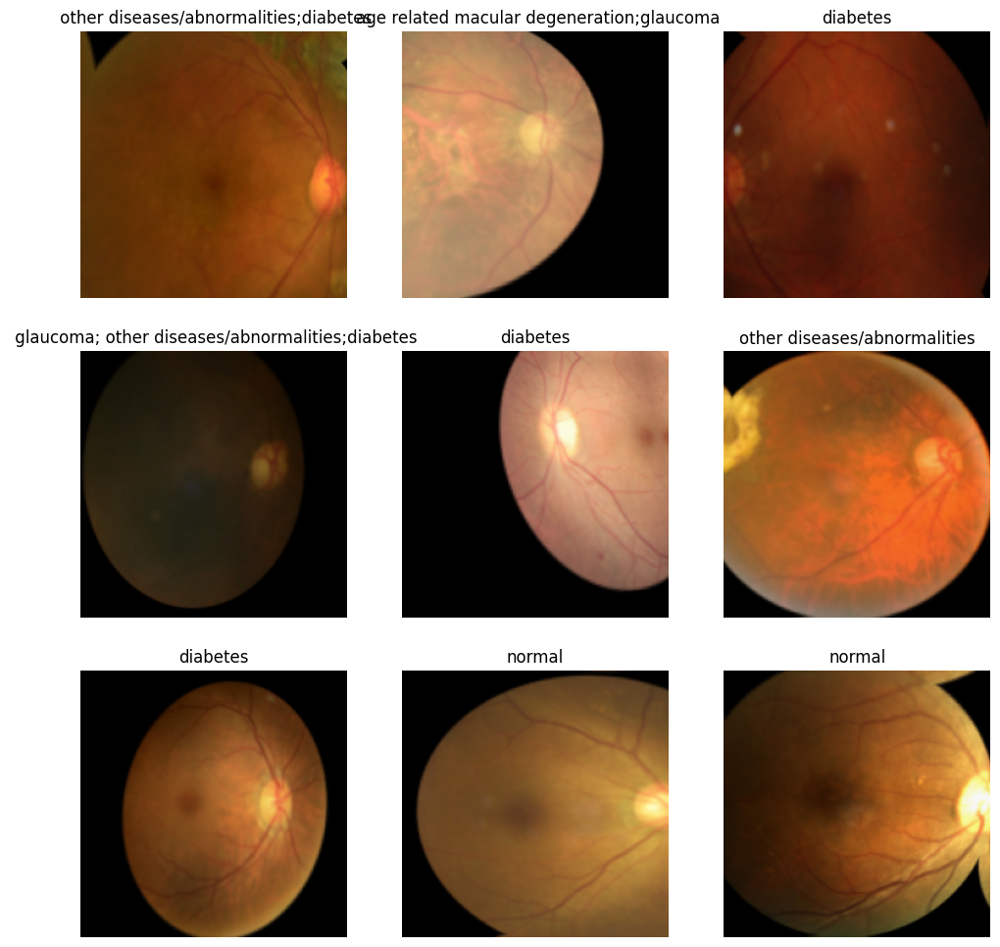

In [ ]:
# Create DataLoaders from the DataBlock
dls = pascal.dataloaders(df)

# Display a batch of images
dls.show_batch(max_n=9, figsize=(12, 12))


/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:301: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 167MB/s]


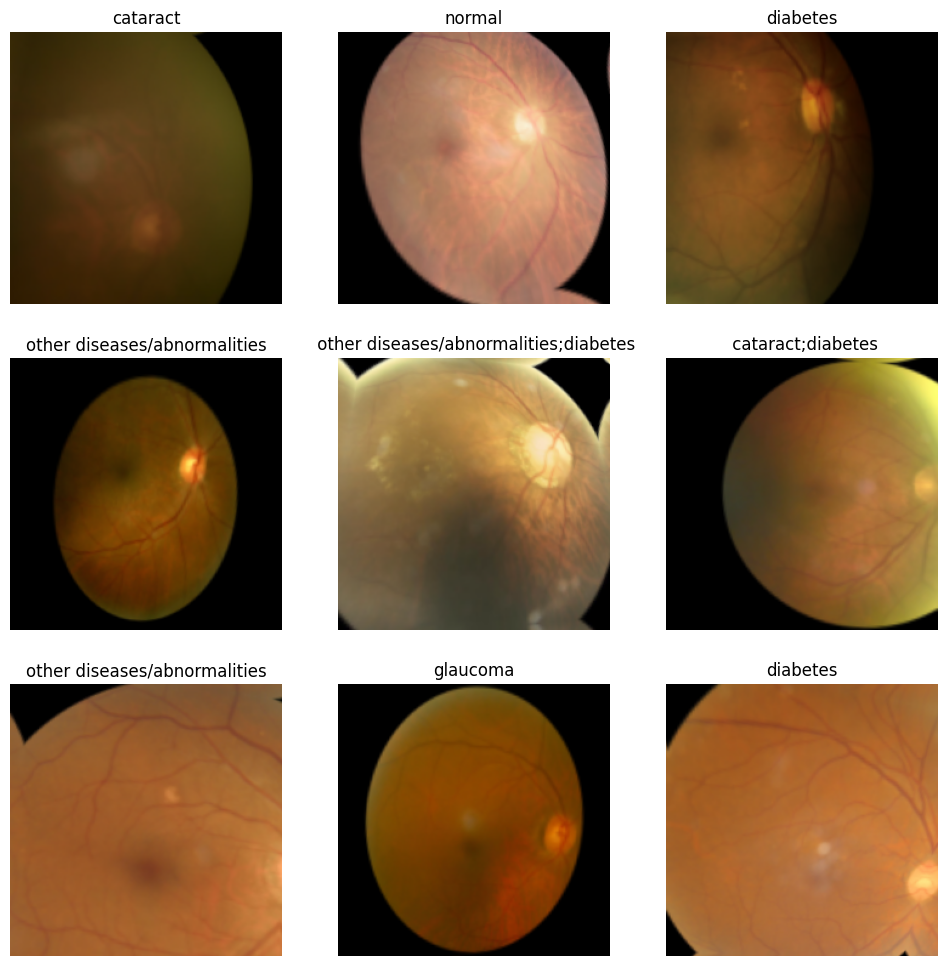

In [ ]:
from fastai.vision.all import *

# Create the DataLoaders
dls = pascal.dataloaders(df)

# Create a learner using cnn_learner
learn = cnn_learner(dls, resnet50, pretrained=True, metrics=[accuracy_multi])

#you can view the model architecture
learn.model

# Optionally, you can inspect the DataLoaders to ensure they are set up correctly
dls.show_batch(max_n=9, figsize=(12, 12))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


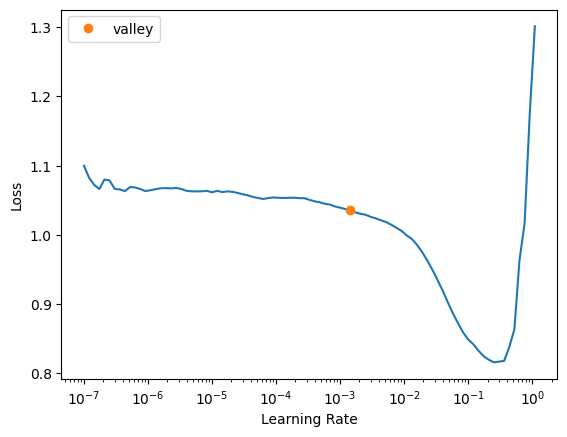

In [ ]:
# Find the optimal learning rate
learn.lr_find()

# plot the learning rate finder results
import matplotlib.pyplot as plt
plt.show()


In [ ]:
#the valley in the lr_find() plot is around 2.7, consider starting with a lower rate.
# Typically, you might use something like 0.27 or 0.027 for safer training.
# Let's use 0.027 for a more conservative start.

# Train the model with the selected learning rate
learn.fit_one_cycle(5, lr_max=0.027)


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.187208,0.198901,0.923206,01:07
1,0.198308,0.195260,0.919908,01:08
2,0.193214,0.184633,0.925833,01:07
3,0.185384,0.183042,0.925889,01:07
4,0.178074,0.178656,0.927957,01:07


In [ ]:
# Continue training for 5 more epochs with a lower learning rate
learn.fit_one_cycle(5, lr_max=0.01)


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.176282,0.180803,0.923989,01:07
1,0.179713,0.181867,0.924994,01:06
2,0.177417,0.178109,0.925833,01:07
3,0.171779,0.175361,0.927062,01:07
4,0.168766,0.173890,0.929074,01:07


In [ ]:
# Unfreeze the model and fine-tune with a lower learning rate
learn.unfreeze()
learn.fit_one_cycle(5, lr_max=slice(1e-6, 1e-4))


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.167024,0.173773,0.928795,01:14
1,0.165884,0.174355,0.928013,01:13
2,0.165495,0.173703,0.928739,01:14
3,0.163607,0.174101,0.928572,01:14
4,0.163858,0.173907,0.929019,01:14


In [ ]:
# Save the model
learn.save('ResNet50')


Path('models/ResNet50.pth')

In [ ]:
test_image_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Testing Images/'

In [ ]:

import pandas as pd
import os

# List all test images
test_images = os.listdir(test_image_dir)

# Create a DataFrame
test_df = pd.DataFrame({
    'filename': test_images,
    'diagnoses': [''] * len(test_images)  # Placeholder for diagnoses
})




In [ ]:
# Show some predictions
learn.show_results()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np


# Create DataLoaders for the test set
test_dblock = DataBlock(
    blocks=(ImageBlock, MultiCategoryBlock),
    get_x=ColReader('filename', pref=test_image_dir),
    get_y=ColReader('diagnoses', label_delim=';'),
    item_tfms=RandomResizedCrop(128, min_scale=0.35),
    batch_tfms=aug_transforms(size=224)
)

# Create DataLoaders
test_dls = test_dblock.dataloaders(test_df)


In [ ]:
print(test_df.head())
print(test_df['diagnoses'].value_counts())


In [ ]:
# Create DataLoaders
test_dls = test_dblock.dataloaders(test_df, bs=64)

# Check a batch of data
xb, yb = test_dls.one_batch()
print(xb.shape, yb.shape)
print(yb)


In [ ]:
# Make sure the learner is using the correct DataLoader
learn.dls = test_dls

# Validate the DataLoader and the content of a batch
xb, yb = next(iter(test_dls.valid))
print(xb.shape, yb.shape)
print(yb)


In [ ]:
import pandas as pd
from fastai.vision.all import *

# Define the path to your testing images
test_image_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Testing Images/'

# Load the test DataFrame
test_df = pd.read_csv('path')

# Reduce test_df to match the number of predictions
test_df = test_df.head(200)  # Use only the first 200 rows if needed

# Create a DataBlock for the test set
test_dblock = DataBlock(
    blocks=(ImageBlock),
    get_x=ColReader('filename', pref=test_image_dir),
    item_tfms=Resize(224),  # Adjust to resize images to the model input size
    batch_tfms=aug_transforms(size=224)
)

# Create DataLoaders for the test set
test_dls = test_dblock.dataloaders(test_df, bs=64, num_workers=4)  # Adjust num_workers if necessary

# Get predictions from the test DataLoader
preds, _ = learn.get_preds(dl=test_dls.valid)

# Binarize the predictions (since this is multi-label classification)
preds = (preds > 0.5).int()

# Convert tensor to numpy array
preds_np = preds.numpy()
print("Predictions shape:", preds_np.shape)

# Ensure the number of labels matches the number of prediction columns
labels = ['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O']  # Adjust labels as per your model output
if preds_np.shape[1] != len(labels):
    raise ValueError(f"Number of labels ({len(labels)}) does not match number of prediction columns ({preds_np.shape[1]})")

# Align predictions with the test DataFrame
preds_df = pd.DataFrame(preds_np, columns=labels)
preds_df['filename'] = test_df['filename'].values

print(preds_df.head())

# Save the predictions DataFrame to a CSV file
preds_df.to_csv('predictions.csv', index=False)


In [ ]:
import pandas as pd
import numpy as np
from fastai.vision.all import *
from sklearn.metrics import multilabel_confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


# Subset the test DataFrame to match the number of predictions (200)
test_df_subset = test_df.iloc[:200]

# Create a DataLoader for this subset
test_dls = learn.dls.test_dl(test_df_subset)

# Get predictions on the subset
preds, _ = learn.get_preds(dl=test_dls)

# Convert predictions to binary format (0 or 1)
preds_binary = (preds > 0.5).int()

# Create fake targets for the test subset since we don't have real labels
# Here, we'll simulate it as all zeros to allow confusion matrix generation
targets_fake = torch.zeros_like(preds_binary)

# Generate the multilabel confusion matrix
cm = multilabel_confusion_matrix(targets_fake, preds_binary)

# Plot the confusion matrix for each label
for i, label_cm in enumerate(cm):
    label_name = learn.dls.vocab[i] if i < len(learn.dls.vocab) else f'label{i+1}'
    plt.figure(figsize=(6, 4))
    sns.heatmap(label_cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix for Label: {label_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


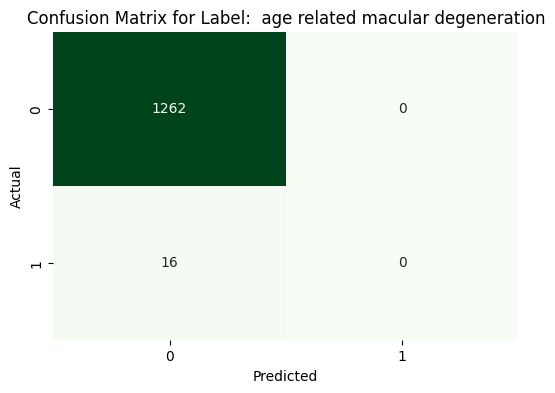

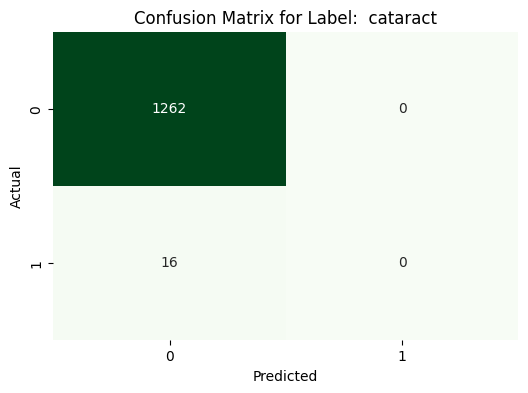

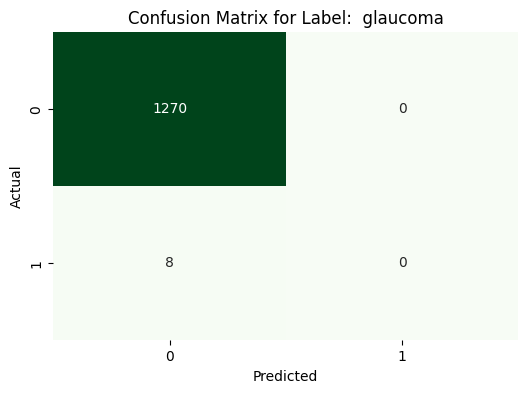

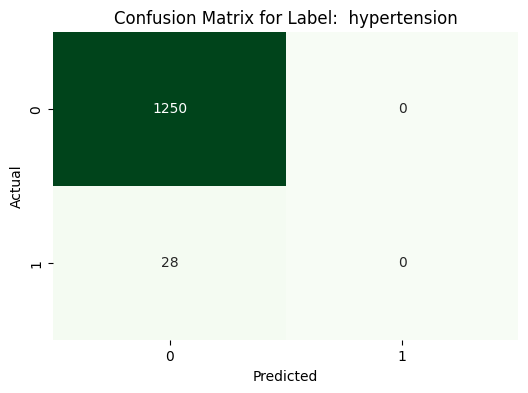

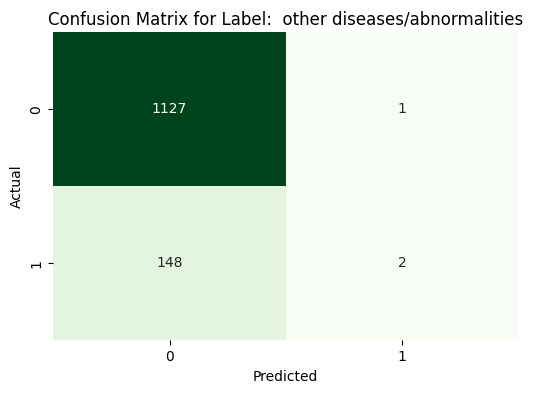

...

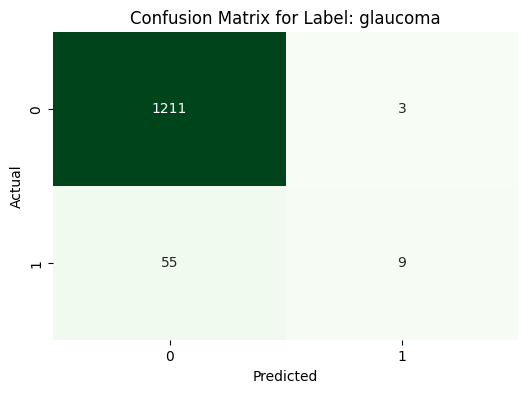

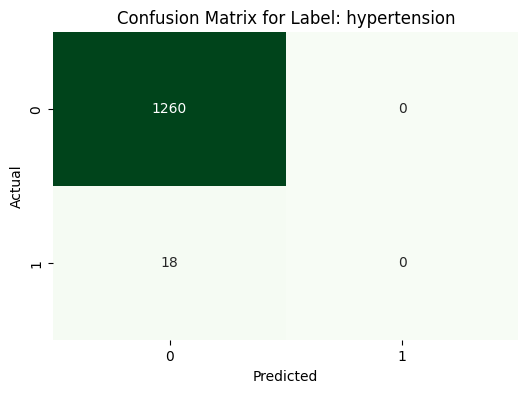

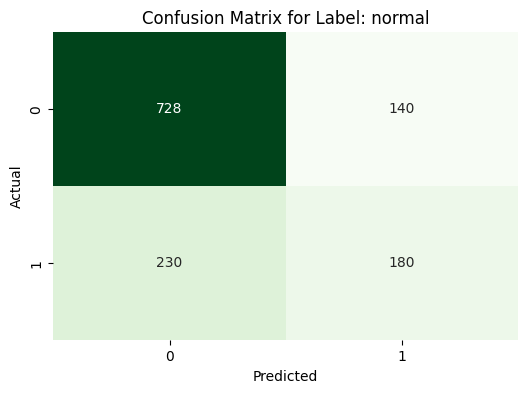

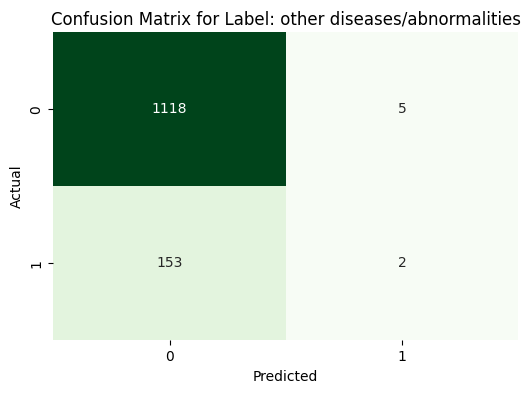

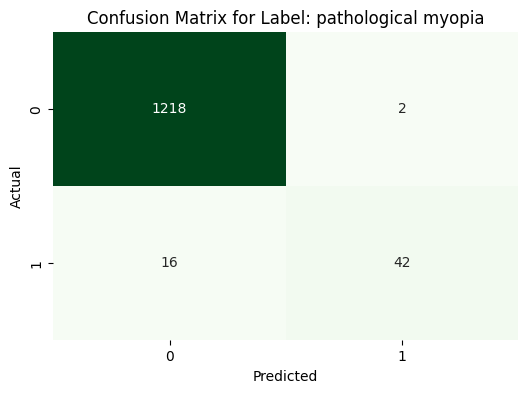

In [ ]:
from fastai.vision.all import *



# Get predictions on the validation dataset
preds, targets = learn.get_preds()

# Convert predictions and targets to binary format
preds_binary = (preds > 0.5).int()
targets_binary = targets.int()

# Generate multilabel confusion matrix
from sklearn.metrics import multilabel_confusion_matrix

# Generate multilabel confusion matrix
cm = multilabel_confusion_matrix(targets_binary, preds_binary)

# Plot confusion matrix for each label
import seaborn as sns
import matplotlib.pyplot as plt

for i, label_cm in enumerate(cm):
    label_name = learn.dls.vocab[i]
    plt.figure(figsize=(6, 4))
    sns.heatmap(label_cm, annot=True, fmt='d', cmap='Greens', cbar=False)
    plt.title(f'Confusion Matrix for Label: {label_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Accuracy: 0.30
Precision: 0.6630
Recall: 0.3065
F1 Score: 0.3769
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.00      0.00        16
           1       1.00      0.00      0.00        16
           2       1.00      0.00      0.00         8
           3       1.00      0.00      0.00        28
           4       0.67      0.01      0.03       150
           5       1.00      0.00      0.00         8
           6       0.58      0.21      0.31        52
           7       0.82      0.56      0.67        55
           8       0.75      0.39      0.52       466
           9       0.75      0.14      0.24        64
          10       1.00      0.00      0.00        18
          11       0.56      0.44      0.49       410
          12       0.29      0.01      0.02       155
          13       0.95      0.72      0.82        58

   micro avg       0.67      0.31      0.42      1504
   macro avg       0.81      0.18      0.22   

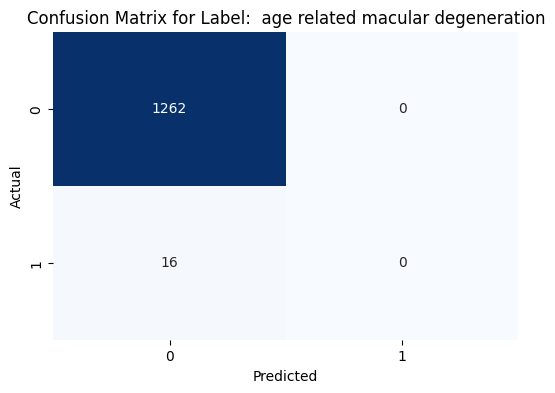

Confusion Matrix for Label:  cataract
[[1262    0]
 [  16    0]]


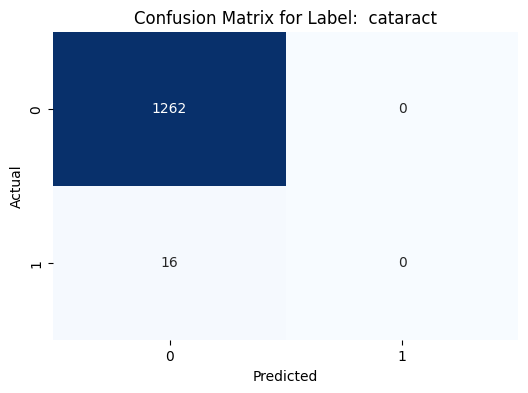

Confusion Matrix for Label:  glaucoma
[[1270    0]
 [   8    0]]


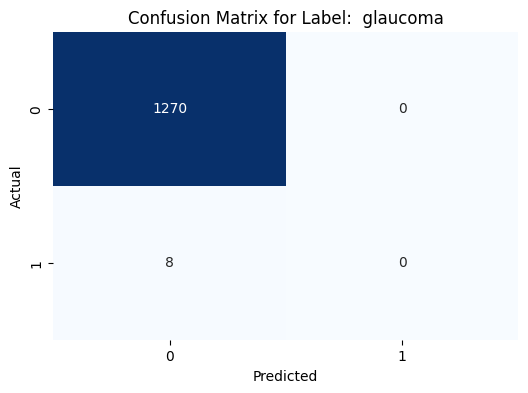

Confusion Matrix for Label:  hypertension
[[1250    0]
 [  28    0]]


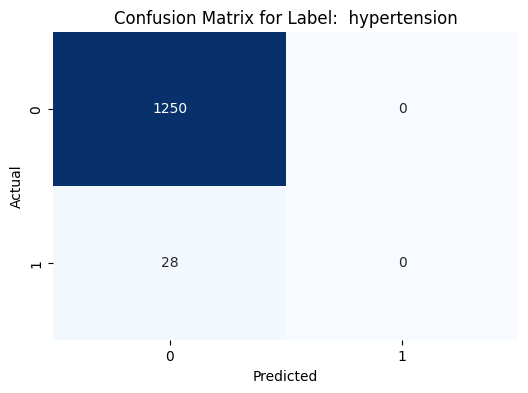

Confusion Matrix for Label:  other diseases/abnormalities
[[1127    1]
 [ 148    2]]


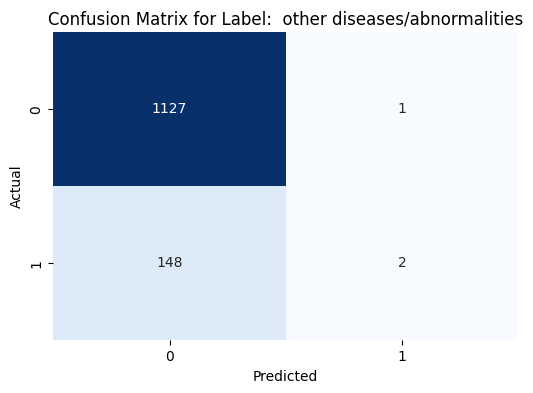

Confusion Matrix for Label:  pathological myopia
[[1270    0]
 [   8    0]]


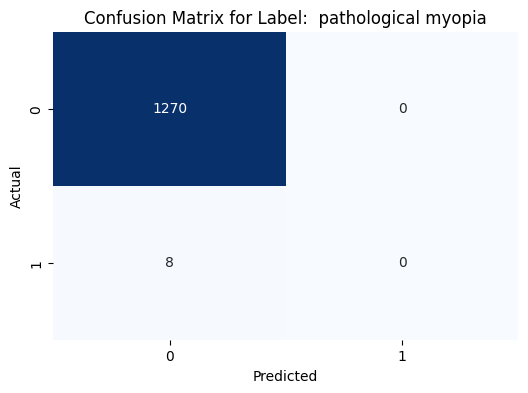

Confusion Matrix for Label: age related macular degeneration
[[1218    8]
 [  41   11]]


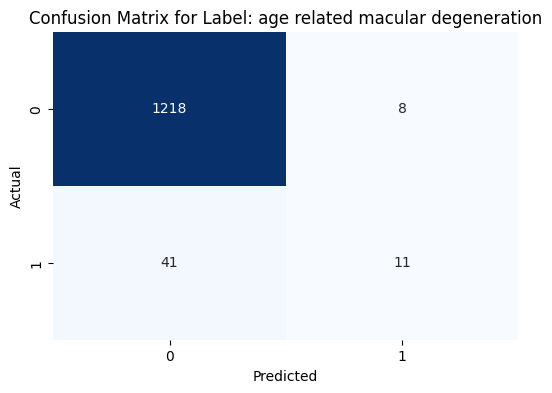

Confusion Matrix for Label: cataract
[[1216    7]
 [  24   31]]


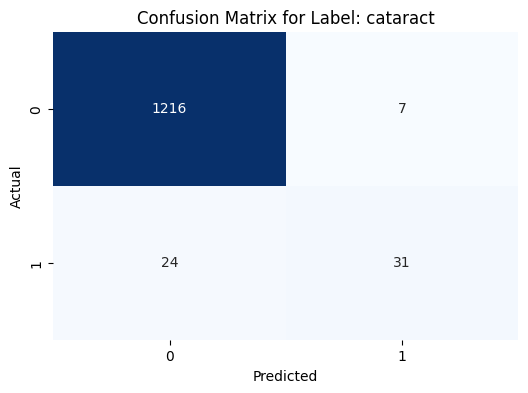

Confusion Matrix for Label: diabetes
[[751  61]
 [282 184]]


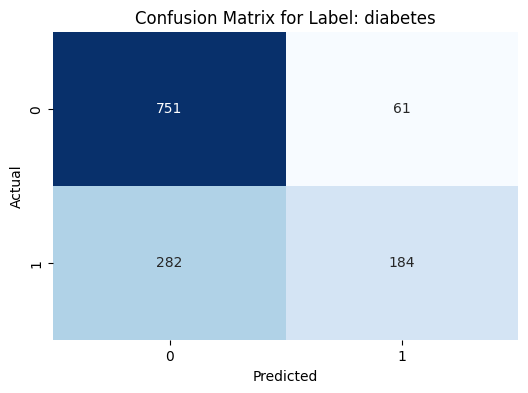

Confusion Matrix for Label: glaucoma
[[1211    3]
 [  55    9]]


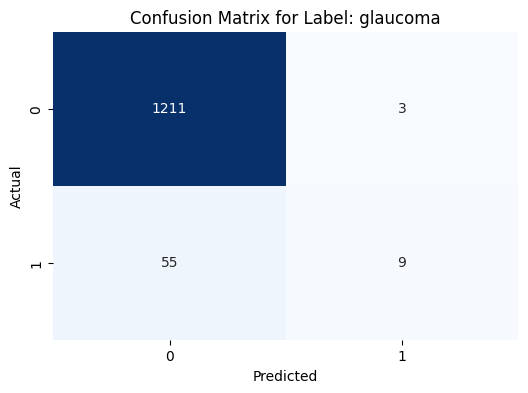

Confusion Matrix for Label: hypertension
[[1260    0]
 [  18    0]]


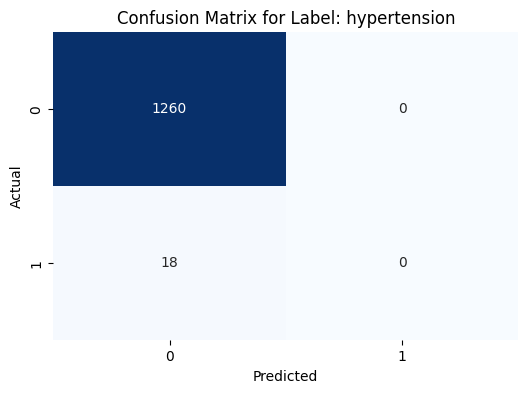

Confusion Matrix for Label: normal
[[728 140]
 [230 180]]


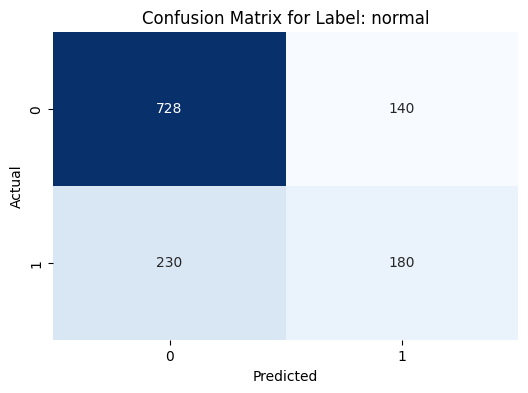

Confusion Matrix for Label: other diseases/abnormalities
[[1118    5]
 [ 153    2]]


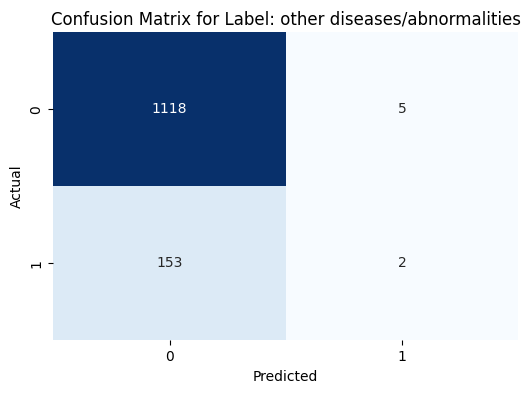

Confusion Matrix for Label: pathological myopia
[[1218    2]
 [  16   42]]


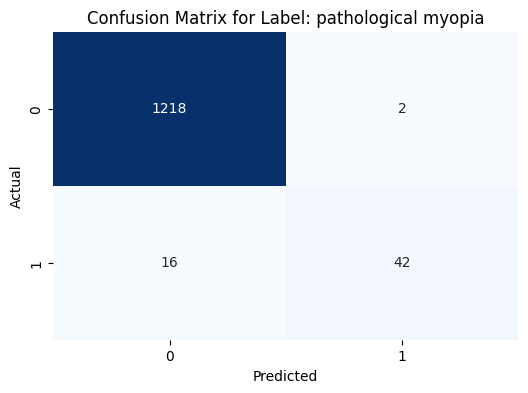

In [ ]:
from fastai.vision.all import *
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, multilabel_confusion_matrix

# Get predictions on the validation set
preds, targets = learn.get_preds()

# Convert predictions and targets to binary labels
preds_binary = (preds > 0.5).int()
targets_binary = targets.int()

# Calculate evaluation metrics
accuracy = accuracy_score(targets_binary, preds_binary)
precision = precision_score(targets_binary, preds_binary, average='weighted', zero_division=1)
recall = recall_score(targets_binary, preds_binary, average='weighted', zero_division=1)
f1 = f1_score(targets_binary, preds_binary, average='weighted', zero_division=1)

# Print evaluation metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

# Generate and print classification report
print("Classification Report:")
print(classification_report(targets_binary, preds_binary, zero_division=1))

# Generate and print multilabel confusion matrix
cm = multilabel_confusion_matrix(targets_binary, preds_binary)

print("Confusion Matrix:")
for i, label_cm in enumerate(cm):
    label_name = learn.dls.vocab[i] if i < len(learn.dls.vocab) else f'label{i+1}'
    print(f'Confusion Matrix for Label: {label_name}')
    print(label_cm)

    # Plot confusion matrix for each label
    plt.figure(figsize=(6, 4))
    sns.heatmap(label_cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix for Label: {label_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


In [ ]:
# Data directories
train_image_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images'

# Append full path to image filenames
df['Left-Fundus'] = df['Left-Fundus'].apply(lambda x: os.path.join(train_image_dir, x))
df['Right-Fundus'] = df['Right-Fundus'].apply(lambda x: os.path.join(train_image_dir, x))

# Creating ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # 20% of the data for validation
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Creating training and validation generators
train_generator = datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Left-Fundus',
    y_col=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'],
    target_size=(224, 224),
    batch_size=32,
    class_mode='raw',
    subset='training'
)

validation_generator = datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Left-Fundus',
    y_col=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'],
    target_size=(224, 224),
    batch_size=32,
    class_mode='raw',
    subset='validation'
)


In [ ]:
# Flatten the y labels for calculation of class weights
y_train = train_generator.labels

# Calculate class weights
class_weights = class_weight.compute_class_weight(
    'balanced',
    classes=np.unique(y_train.argmax(axis=1)),
    y=y_train.argmax(axis=1)
)

class_weights_dict = dict(enumerate(class_weights))
print("Class weights:", class_weights_dict)


In [ ]:
# Load the VGG16 model with pre-trained ImageNet weights
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Add custom layers on top of the base model
x = base_model.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(8, activation='sigmoid')(x)

# Define the model
model_vgg16 = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_vgg16.compile(optimizer=Adam(learning_rate=0.1), loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
model_vgg16.summary()






In [ ]:
# Define callbacks
checkpoint = ModelCheckpoint('best_model_vgg16.keras', monitor='val_loss', save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
vgg16_history = model_vgg16.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    callbacks=[checkpoint, early_stopping],
    class_weight=class_weights_dict
)


In [ ]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import os
import shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Ensure paths are correct
csv_file_path = '/content/drive/MyDrive/archive-2/full_df.csv'
train_image_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images'


In [ ]:
# Load the CSV file
df = pd.read_csv(csv_file_path)

# Append full path to image filenames
df['Left-Fundus'] = df['Left-Fundus'].apply(lambda x: os.path.join(train_image_dir, x))
df['Right-Fundus'] = df['Right-Fundus'].apply(lambda x: os.path.join(train_image_dir, x))

# Check if directories exist and create if not
split_data_path = 'split_data'
train_split_path = os.path.join(split_data_path, 'train')
validation_split_path = os.path.join(split_data_path, 'validation')

os.makedirs(train_split_path, exist_ok=True)
os.makedirs(validation_split_path, exist_ok=True)

# Function to split data
def split_data(df, train_split_path, validation_split_path, val_split=0.2):
    train_df, val_df = train_test_split(df, test_size=val_split, random_state=42)

    # Function to copy images to respective directories
    def copy_images(dataframe, dest_dir):
        for index, row in dataframe.iterrows():
            # Left eye
            shutil.copy(row['Left-Fundus'], os.path.join(dest_dir, 'Left', os.path.basename(row['Left-Fundus'])))
            # Right eye
            shutil.copy(row['Right-Fundus'], os.path.join(dest_dir, 'Right', os.path.basename(row['Right-Fundus'])))

    os.makedirs(os.path.join(train_split_path, 'Left'), exist_ok=True)
    os.makedirs(os.path.join(train_split_path, 'Right'), exist_ok=True)
    os.makedirs(os.path.join(validation_split_path, 'Left'), exist_ok=True)
    os.makedirs(os.path.join(validation_split_path, 'Right'), exist_ok=True)

    copy_images(train_df, train_split_path)
    copy_images(val_df, validation_split_path)

# Split the data
split_data(df, train_split_path, validation_split_path)


In [ ]:
df["diagnoses"] = ""

def process_path(index, row):
    diagnoses = ""
    if (row['N']==1):
        diagnoses += "normal;"
    if (row['D']==1):
        diagnoses += "diabetes;"
    if (row['G']==1):
        diagnoses += "glaucoma;"
    if (row['C']==1):
        diagnoses += "cataract;"
    if (row['A']==1):
        diagnoses += "age related macular degeneration;"
    if (row['H']==1):
        diagnoses += "hypertension;"
    if (row['M']==1):
        diagnoses += "pathological myopia;"
    if (row['O']==1):
        diagnoses += "other diseases/abnormalities;"
    row["diagnoses"] = diagnoses
    df.loc[index] = row

updated_paths = [process_path(index, row) for index, row in df.iterrows()]

In [ ]:
img = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter=RandomSplitter(valid_pct=0.2, seed=42),
                   get_x=ColReader('filename', pref=str(train_split_path)),
                   get_y=ColReader('diagnoses', label_delim=';'),
                   item_tfms = RandomResizedCrop(128, min_scale=0.35),
                   batch_tfms=aug_transforms(size=224))

In [ ]:
# Data directories
train_image_dir = '/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images'

# Append full path to image filenames
df['Left-Fundus'] = df['Left-Fundus'].apply(lambda x: os.path.join(train_image_dir, x))
df['Right-Fundus'] = df['Right-Fundus'].apply(lambda x: os.path.join(train_image_dir, x))

# Creating ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # 20% of the data for validation
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Creating training and validation generators
train_generator = datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Left-Fundus',
    y_col=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'],
    target_size=(224, 224),
    batch_size=32,
    class_mode='raw',
    subset='training'
)

validation_generator = datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Left-Fundus',
    y_col=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'],
    target_size=(224, 224),
    batch_size=32,
    class_mode='raw',
    subset='validation'
)


In [ ]:
# Load the VGG16 model with pre-trained ImageNet weights
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Add custom layers on top of the base model
x = base_model.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(8, activation='sigmoid')(x)  # 8 classes for multi-label classification

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
model.summary()


In [ ]:
!pip show tensorflow
!pip install --upgrade tensorflow


In [ ]:


# Load the VGG16 model with pre-trained ImageNet weights
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Add custom layers on top of the base model
x = base_model.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(8, activation='sigmoid')(x)  # 8 classes for multi-label classification

# Define the model
model_vgg16 = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_vgg16.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
model_vgg16.summary()


In [ ]:
pip install --upgrade tensorflow


In [ ]:
# Load the VGG16 model with pre-trained ImageNet weights
base_model_vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model_vgg16.trainable = False

# Add custom layers on top of the base model
model_vgg16 = Sequential([
    base_model_vgg16,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='sigmoid')  # 8 classes for multi-label classification
])

# Compile the model
optimizer = Adam(learning_rate=0.0001)
model_vgg16.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
model_vgg16.summary()


In [ ]:
# Define callbacks
checkpoint = ModelCheckpoint('best_model_vgg16.keras', monitor='val_loss', save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)

# Train the model
vgg16_history = model_vgg16.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    callbacks=[checkpoint, early_stopping, reduce_lr],
    class_weight=class_weights_dict
)


In [ ]:
# Plotting the training and validation loss and accuracy
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(vgg16_history.history['accuracy'], label='Train Accuracy')
plt.plot(vgg16_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(vgg16_history.history['loss'], label='Train Loss')
plt.plot(vgg16_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Model Loss')

plt.show()

# Load the best model
model_vgg16.load_weights('best_model_vgg16.h5')

# Evaluate on validation data
loss, accuracy = model_vgg16.evaluate(validation_generator)
print(f'Validation Loss: {loss}')
print(f'Validation Accuracy: {accuracy}')


In [ ]:
# Generate predictions
val_generator = validation_datagen.flow_from_dataframe(
    dataframe=df,
    directory=None,
    x_col='Left-Fundus',
    y_col=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O'],
    target_size=(224, 224),
    batch_size=1,
    class_mode='raw',
    shuffle=False,
    subset='validation'
)

val_predictions = model_vgg16.predict(val_generator, steps=len(val_generator), verbose=1)
val_labels = val_generator.labels

# Convert predictions and labels to binary format
val_predictions_binary = (val_predictions > 0.5).astype(int)

# Generate classification report
print(classification_report(val_labels, val_predictions_binary, target_names=['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O']))


Build the Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers

# Number of classes
classes = len(list(train_augmented.class_indices.keys()))

# Load the EfficientNetB3 model without the top classification layer
base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Build the custom model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
predictions = Dense(classes, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()


Train with VGG16

In [ ]:
import matplotlib.pyplot as plt



plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

plt.show()


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(
    train_augmented,
    epochs=50,  # Increase number of epochs
    validation_data=valid_augmented,
    steps_per_epoch=train_augmented.samples // train_augmented.batch_size,
    validation_steps=valid_augmented.samples // valid_augmented.batch_size,
    callbacks=[early_stopping]
)


In [ ]:
import matplotlib.pyplot as plt


plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# Define a function to load and preprocess images
def preprocess_image(filepath, target_size=(224, 224)):
    img = load_img(filepath, target_size=target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Rescale to [0, 1]
    return img_array

# Load and preprocess images
image_data = []
for filename in df['filename']:
    filepath = f"/content/archive-2/archive-2/ODIR-5K/ODIR-5K/Training Images/{filename}"
    img_array = preprocess_image(filepath)
    image_data.append(img_array)

# Convert list to numpy array
X_images = np.vstack(image_data)


In [ ]:
import ast

# Convert the target column from string representation to actual list
df['target'] = df['target'].apply(ast.literal_eval)
Y = np.array(df['target'].tolist())


Class Imbalance Handling:

The dataset has imbalanced classes, it can lead to the model being biased towards the majority class. So class weights was added

    Class Weights: Adjust class weights in the loss function.


In [ ]:
# Calculate class weights
from sklearn.utils import class_weight
import numpy as np

class_weights = class_weight.compute_class_weight(
    'balanced',
    np.unique(train_labels),
    np.array(train_labels)
)

class_weight_dict = dict(enumerate(class_weights))


In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3, VGG19
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt

# Load the VGG16 model without the top layer (classifier)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom top layers
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(8, activation='sigmoid')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the convolutional base
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

score = model.evaluate(X_test, y_test, verbose=0)


# Print evaluation results
print(f"{model_name} Test loss:", score[0])
print(f"{model_name} Test accuracy:", score[1])

    # Generate classification report
y_pred = (model.predict(X_test) > 0.5).astype("int32")
print(f"{model_name} Classification Report:")
print(classification_report(y_test, y_pred))

    # Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title(f'{model_name} Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title(f'{model_name} Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


Train with VGG16

In [ ]:

base_model_vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
train_model(base_model_vgg16, X_train, y_train, X_test, y_test, "VGG16")


Train with VGG19

In [ ]:
from tensorflow.keras.applications import VGG19
base_model_vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
train_model(base_model_vgg19, X_train, y_train, X_test, y_test, "VGG19")


Train with ResNet50

In [ ]:

base_model_resnet50 = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

history_resnet50 = train_model(base_model_resnet50, X_train, y_train, X_test, y_test, "ResNet50")


Train with DenseNet121

In [ ]:
base_model_densenet121 = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
train_model(base_model_densenet121, X_train, y_train, X_test, y_test, "DenseNet121")
